In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy import signal
from scipy.signal import butter, filtfilt, find_peaks, medfilt
from sklearn import preprocessing
%matplotlib notebook

## Prepare the data

In [3]:
df_test= pd.read_csv('../carlos_ref_22/CNAP_2022-02-02_19-09-37_001_beats.csv', delimiter = ';')
df_wav = pd.read_csv('../carlos_ref_22/CNAP_2022-02-02_19-09-37_001_waveform.csv', delimiter = ';')
df_sen = pd.read_csv('../carlos_ref_22/2022-02-02-18-14-07.csv', names = ['ts_ecg', 'ecg', 'ts_ppg', 'ppg'])

In [4]:
print(df_test[df_test['Event']=='Custom1'])
#df_sen
df_wav[df_wav['Time [s]']==226.39]
df_wav[df_wav['Time [s]']==256.90]

     Time [s]  Beat Sys [mmHg]  Beat Mean [mmHg]  Beat Dia [mmHg]  \
223    226.39              NaN               NaN              NaN   
264    256.90            114.0              91.0             79.0   

     Beat HR [bpm]  NBP Sys [mmHg]  NBP Dia [mmHg]    Event  \
223            NaN             NaN             NaN  Custom1   
264           65.0             NaN             NaN  Custom1   

     Height Offset [cm]  Unnamed: 9  
223                 NaN         NaN  
264                 NaN         NaN  


,Time [s],Pressure [mmHg],Unnamed: 2
25690,256.9,93.34,NaN


<IPython.core.display.Javascript object>


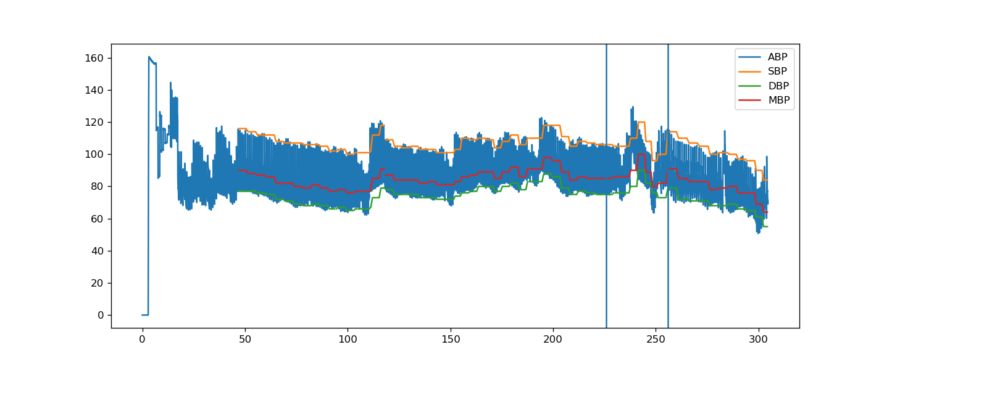

In [5]:
plt.figure(figsize = (12,5))
plt.plot(df_wav['Time [s]'], df_wav['Pressure [mmHg]'], label = 'ABP')
plt.plot(df_test['Time [s]'], df_test['Beat Sys [mmHg]'], label = 'SBP')
plt.plot(df_test['Time [s]'], df_test['Beat Dia [mmHg]'], label = 'DBP')
plt.plot(df_test['Time [s]'], df_test['Beat Mean [mmHg]'], label = 'MBP')
plt.axvline(x=226)
plt.axvline(x=256)
plt.legend()

In [6]:
ecg_sen = df_sen['ecg'].values[5:]
ppg_sen = df_sen['ppg'].values[5:]

In [7]:
#butterworth filter & filtering
def butter_filtering(sig,fs,fc,order,btype): 
    """
    sig: original signal
    fs: sampling frequency
    fc: cut off frequency
    order: order of filter
    btype: type of filter (highpass/lowpass/bandpass)
    
    return: filtered signal
    """
    w = np.array(fc)/(fs/2)
    b, a = butter(order, w, btype =btype, analog=False)
    filtered = filtfilt(b, a, sig)
    return(filtered)

In [8]:
ecg_f = butter_filtering(ecg_sen, 200, [0.1, 50], 5, 'bandpass')
ppg_f = butter_filtering(ppg_sen, 200, [0.5, 10], 5, 'bandpass')

<IPython.core.display.Javascript object>


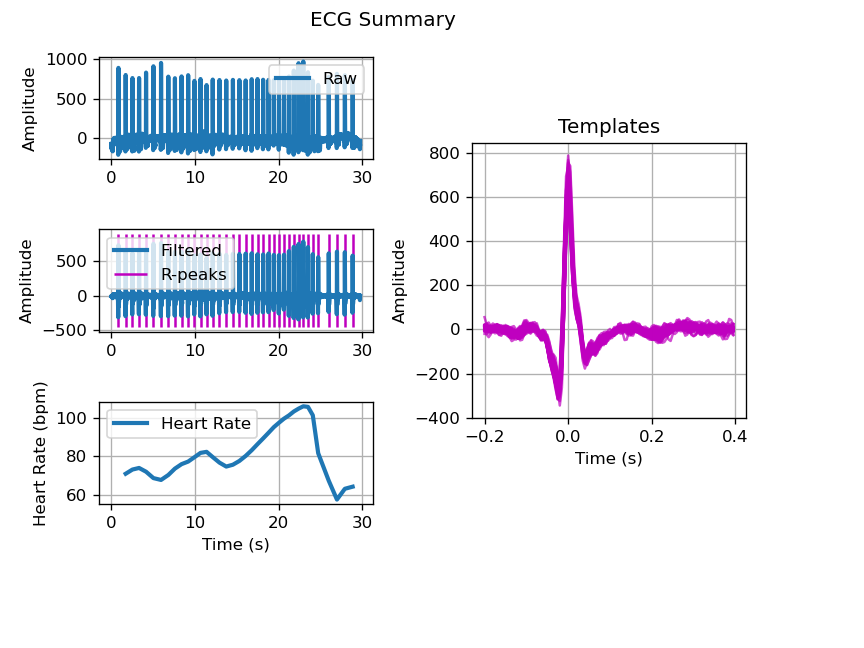

In [9]:
from biosppy.signals import ecg
ecg_feat = ecg.ecg(1*ecg_f, sampling_rate=200.0, show=True)

In [10]:
ts = ecg_feat[0]
filtered = ecg_feat[1]
rpeaks = ecg_feat[2]
templates_ts = ecg_feat[3]
templates = ecg_feat[4]
heart_rate_ts = ecg_feat[5]
heart_rate = ecg_feat[6]

<IPython.core.display.Javascript object>


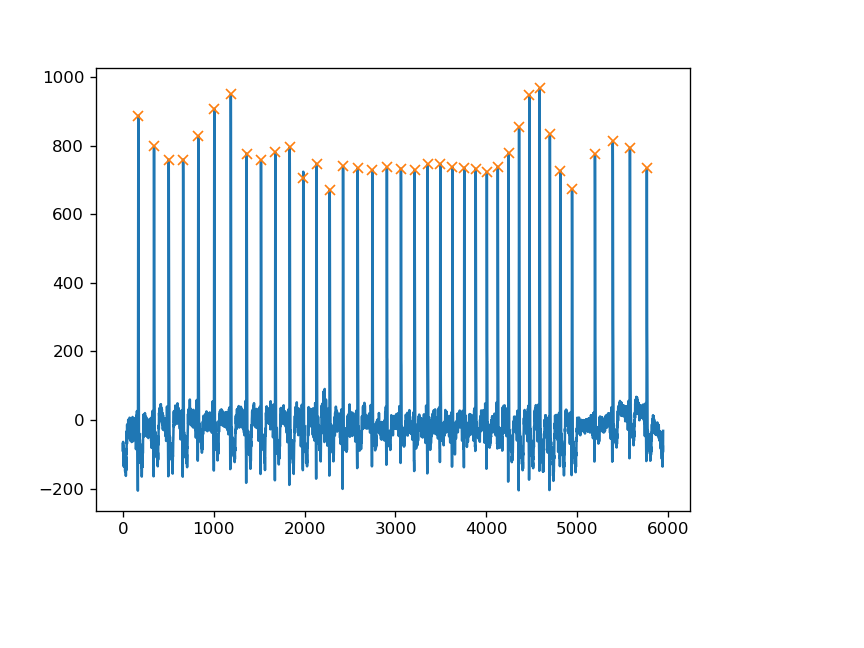

In [11]:
#rpeaks in ecg
plt.figure()
plt.plot(ecg_f)
plt.plot(rpeaks, ecg_f[rpeaks], 'x')


<IPython.core.display.Javascript object>


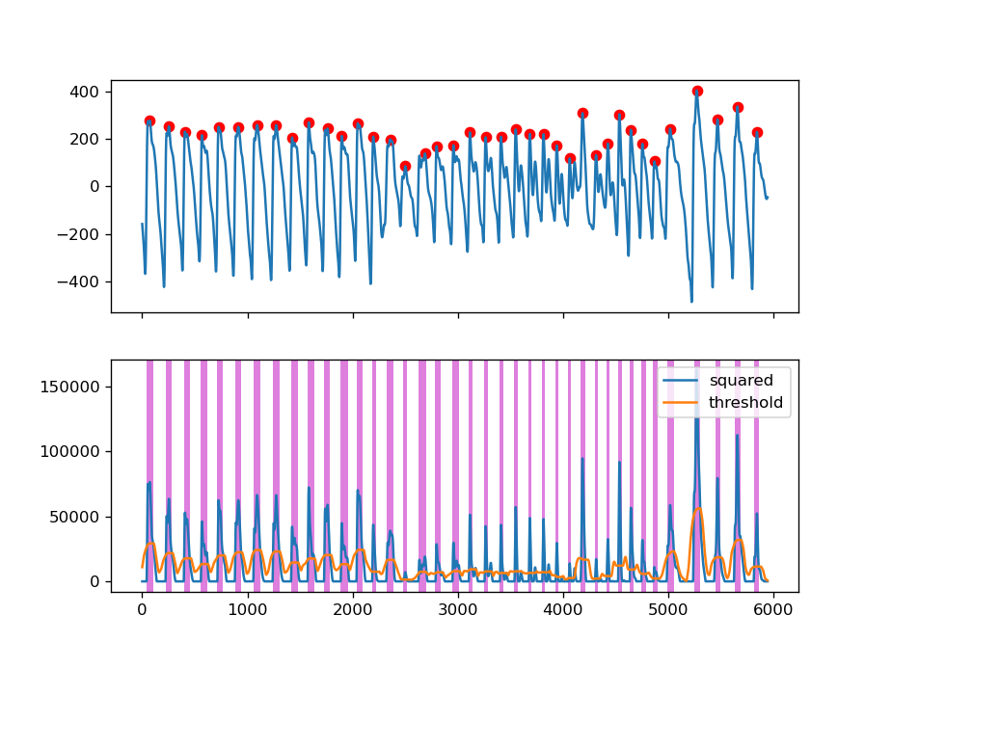

In [12]:
import neurokit2 as nk
info = nk.ppg_findpeaks(-1*ppg_f, sampling_rate=200, method='elgendi', show=True)

<IPython.core.display.Javascript object>


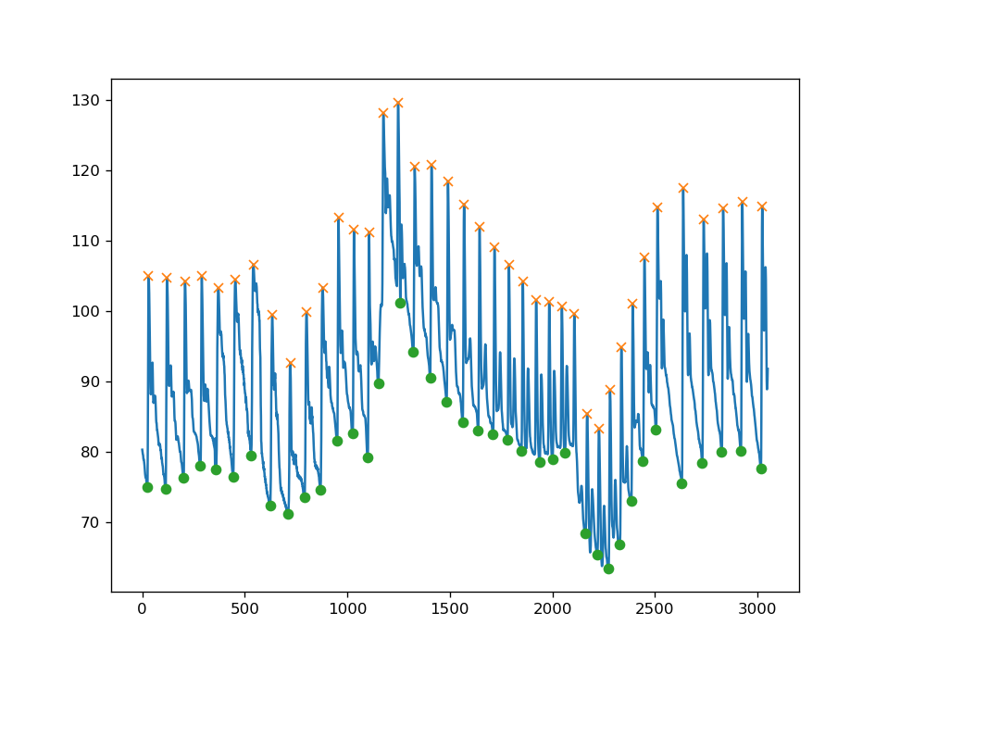

In [33]:
abp = df_wav['Pressure [mmHg]'].values[22639:25690]
plt.figure(figsize = (8,6))
plt.plot(abp)
sbp_loc = find_peaks(abp, distance = 50, height = 80, width = 2)[0]
dbp_loc = find_peaks(-1*abp, distance = 50, height = -105, width = 2)[0]
plt.plot(sbp_loc, abp[sbp_loc], 'x')
plt.plot(dbp_loc, abp[dbp_loc], 'o')

In [55]:
#200Hz 5s window = 1000samples
#2.5s overlapping step = 500samples
#calculate HR and PATpeak on each 5-second window

win = 1000#5s
step = 500#2.5s

hr_lis = []
pat_lis = []
sbp_lis = []
dbp_lis = []

for i in range(0, len(ecg_f) - win, 500):
    st_idx = i
    end_idx = i+win
    rpeaks = ecg.ecg(-1*ecg_f[st_idx:end_idx], sampling_rate=200.0, show=False)[2]
    if i==0:
        start_time = rpeaks[0]/200
    intervals = np.diff(rpeaks)/200
    hr = 60/np.mean(intervals)
    hr_lis.append(hr)
    info = nk.ppg_findpeaks(-1*ppg_f[st_idx:end_idx], sampling_rate=200, method='elgendi', show=False)
    ppeaks = info['PPG_Peaks']
    cor = np.where(ppeaks>=rpeaks[0])
    ppeaks_cor = ppeaks[cor]
    
    maxlen = min(len(ppeaks_cor),len(rpeaks) )
    pat = np.mean((ppeaks_cor[:maxlen] - rpeaks[:maxlen])/200)
    pat_lis.append(pat)
    
win_bp = 5*100
step_bp = 2.5*100

for i in range(0, len(abp)-500, int(step_bp)):
    st_idx = i
    end_idx = i+win
    sbp_loc = find_peaks(abp[st_idx:end_idx], distance = 50, height = 80, width = 2)[0]
    sbp_mean = np.mean(abp[st_idx:end_idx][sbp_loc])
    sbp_lis.append(sbp_mean)
    
    dbp_loc = find_peaks(-1*abp[st_idx:end_idx], distance = 50, height = -105, width = 2)[0]
    dbp_mean = np.mean(abp[st_idx:end_idx][dbp_loc])
    dbp_lis.append(dbp_mean)

In [42]:
len(sbp_lis)

11

In [43]:
len(dbp_lis)

11

In [56]:
start_time

0.825

<IPython.core.display.Javascript object>


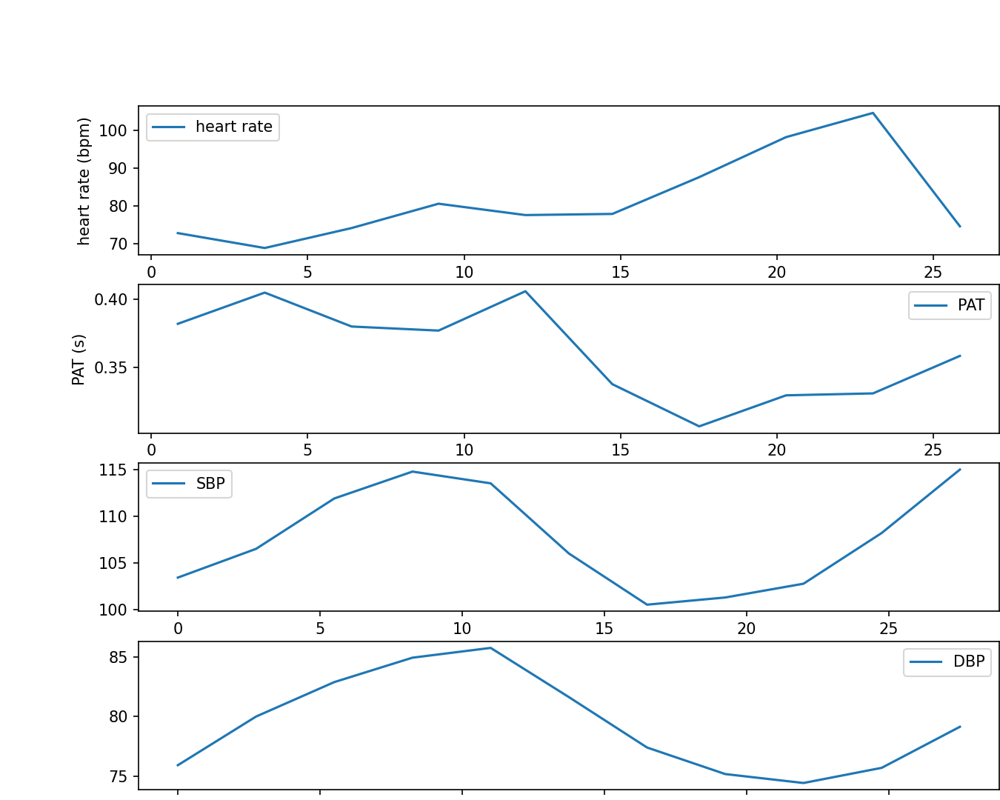

In [57]:
ts_hr = np.linspace(5/200+start_time,start_time+ 5/200+2.5*len(hr_lis), len(hr_lis))
ts_pat = np.linspace(start_time +5/200, start_time+5/200+2.5*len(pat_lis), len(pat_lis))
ts_sbp = np.linspace(0,2.5*len(sbp_lis), len(sbp_lis) )
ts_dbp = np.linspace(0,2.5*len(dbp_lis), len(dbp_lis))
fig, axs = plt.subplots(4,1,figsize = (10,8))
ax = axs[0]
#ax.set_title('valsalva maneuver 10s')
ax.plot(ts_hr, hr_lis, label = "heart rate")
ax.set_xlabel('time(s)');ax.set_ylabel('heart rate (bpm)')
ax.legend()

ax = axs[1]
ax.plot(ts_pat, pat_lis, label = "PAT")
#ax.axvline(x= 10, ls = ':', c = 'g', label = 'start')
#ax.axvline(x= , ls = '--', c = 'r', label = 'end')
ax.set_xlabel('time(s)'); ax.set_ylabel('PAT (s)')
ax.legend()

ax = axs[2]
ax.plot(ts_sbp,sbp_lis, label = 'SBP')
ax.legend()

ax= axs[3]
ax.plot(ts_dbp, dbp_lis, label = 'DBP')
ax.legend()

In [64]:
df_1814 = pd.DataFrame({'hr':hr_lis, 'pat':pat_lis, 'sbp':sbp_lis[-10:], 'dbp':dbp_lis[-10:]})

In [65]:
df_1814

,hr,pat,sbp,dbp
0,72.727273,0.382000,106.537500,80.002308
1,68.767908,0.405000,111.934615,82.893077
2,74.074074,0.380000,114.816154,84.943077
3,80.536913,0.377000,113.557857,85.763846
4,77.519380,0.406000,106.041333,81.635333
5,77.821012,0.337500,100.555625,77.402667
6,87.591241,0.306429,101.326000,75.175714
7,98.226467,0.329286,102.801538,74.425833
8,104.651163,0.330714,108.237000,75.699000
9,74.534161,0.358333,115.031667,79.143333


In [79]:
df_1814.to_csv("1814.csv", index = False)

In [80]:
d = pd.read_csv('1814.csv')

In [81]:
d.head()

,hr,pat,sbp,dbp
0,72.727273,0.382,106.537500,80.002308
1,68.767908,0.405,111.934615,82.893077
2,74.074074,0.380,114.816154,84.943077
3,80.536913,0.377,113.557857,85.763846
4,77.519380,0.406,106.041333,81.635333


In [110]:
#1830
df_test= pd.read_csv('../carlos_ref_22/2022-02-02-18-30-42/CNAP_2022-02-02_19-26-05_001_beats.csv', delimiter = ';')
df_wav = pd.read_csv('../carlos_ref_22/2022-02-02-18-30-42/CNAP_2022-02-02_19-26-05_001_waveform.csv', delimiter = ';')
df_sen = pd.read_csv('../carlos_ref_22/2022-02-02-18-30-42/2022-02-02-18-30-42.csv', names = ['ts_ecg', 'ecg', 'ts_ppg', 'ppg'])

In [111]:
print(df_test[df_test['Event']=='Custom1'])

df_wav[df_wav['Time [s]']==234.68]
df_wav[df_wav['Time [s]']==264.90]

     Time [s]  Beat Sys [mmHg]  Beat Mean [mmHg]  Beat Dia [mmHg]  \
229    234.68              NaN               NaN              NaN   
272    264.90              NaN               NaN              NaN   

     Beat HR [bpm]  NBP Sys [mmHg]  NBP Dia [mmHg]    Event  \
229            NaN             NaN             NaN  Custom1   
272            NaN             NaN             NaN  Custom1   

     Height Offset [cm]  Unnamed: 9  
229                 NaN         NaN  
272                 NaN         NaN  


,Time [s],Pressure [mmHg],Unnamed: 2
26490,264.9,96.75,NaN


<IPython.core.display.Javascript object>


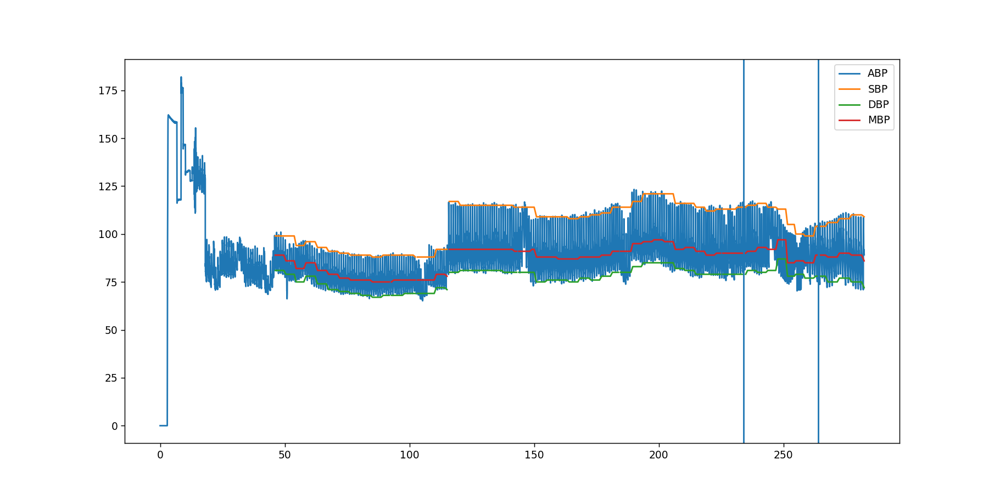

In [112]:
plt.figure(figsize = (10,5))
plt.plot(df_wav['Time [s]'], df_wav['Pressure [mmHg]'], label = 'ABP')
plt.plot(df_test['Time [s]'], df_test['Beat Sys [mmHg]'], label = 'SBP')
plt.plot(df_test['Time [s]'], df_test['Beat Dia [mmHg]'], label = 'DBP')
plt.plot(df_test['Time [s]'], df_test['Beat Mean [mmHg]'], label = 'MBP')
plt.axvline(x=234)
plt.axvline(x=264)
plt.legend()

In [113]:
ecg_sen = df_sen['ecg'].values[5:]
ppg_sen = df_sen['ppg'].values[5:]

ecg_f = butter_filtering(ecg_sen, 200, [0.1, 50], 5, 'bandpass')
ppg_f = butter_filtering(ppg_sen, 200, [0.5, 10], 5, 'bandpass')


<IPython.core.display.Javascript object>


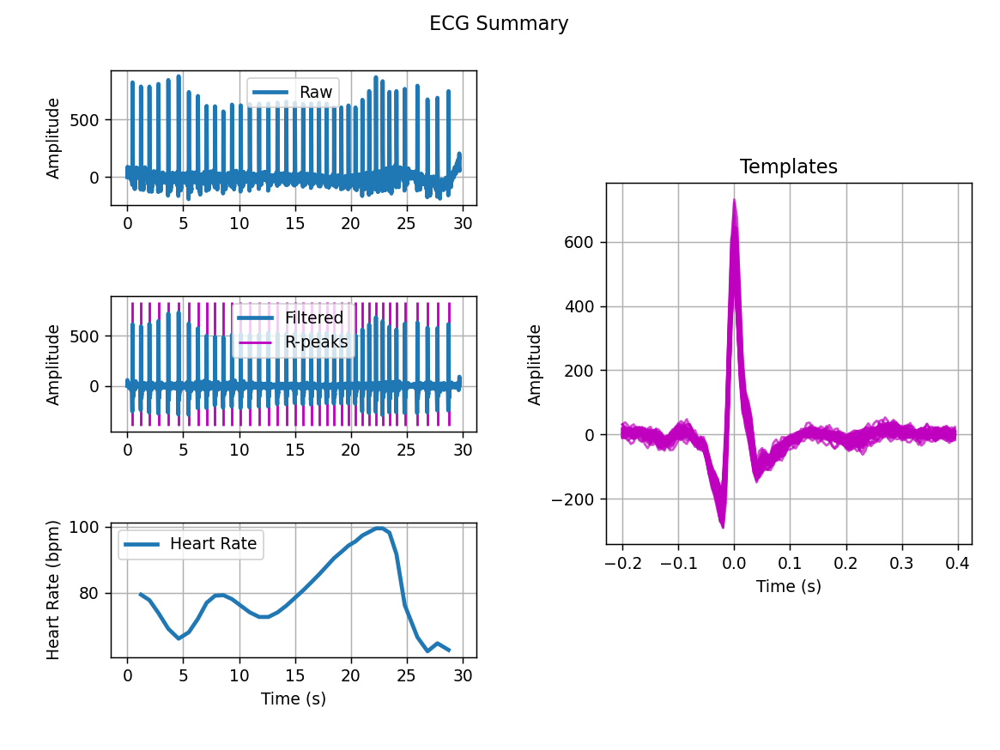

In [114]:
from biosppy.signals import ecg
ecg_feat = ecg.ecg(1*ecg_f, sampling_rate=200.0, show=True)
ts = ecg_feat[0]
filtered = ecg_feat[1]
rpeaks = ecg_feat[2]
templates_ts = ecg_feat[3]
templates = ecg_feat[4]
heart_rate_ts = ecg_feat[5]
heart_rate = ecg_feat[6]

<IPython.core.display.Javascript object>


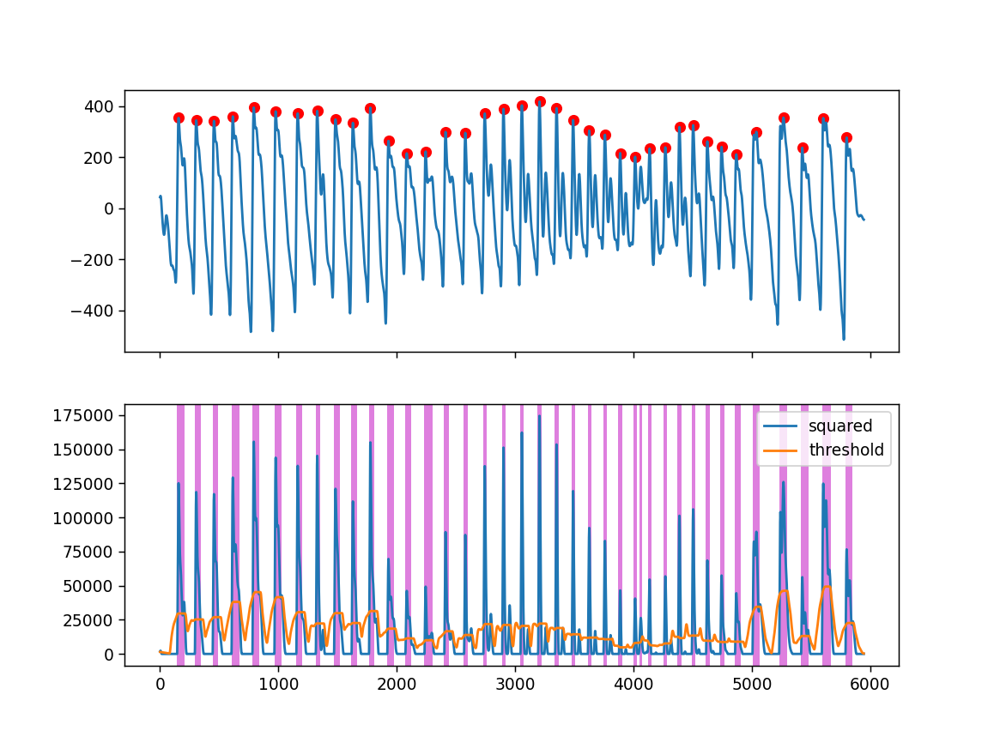

In [115]:
import neurokit2 as nk
info = nk.ppg_findpeaks(-1*ppg_f, sampling_rate=200, method='elgendi', show=True)

<IPython.core.display.Javascript object>


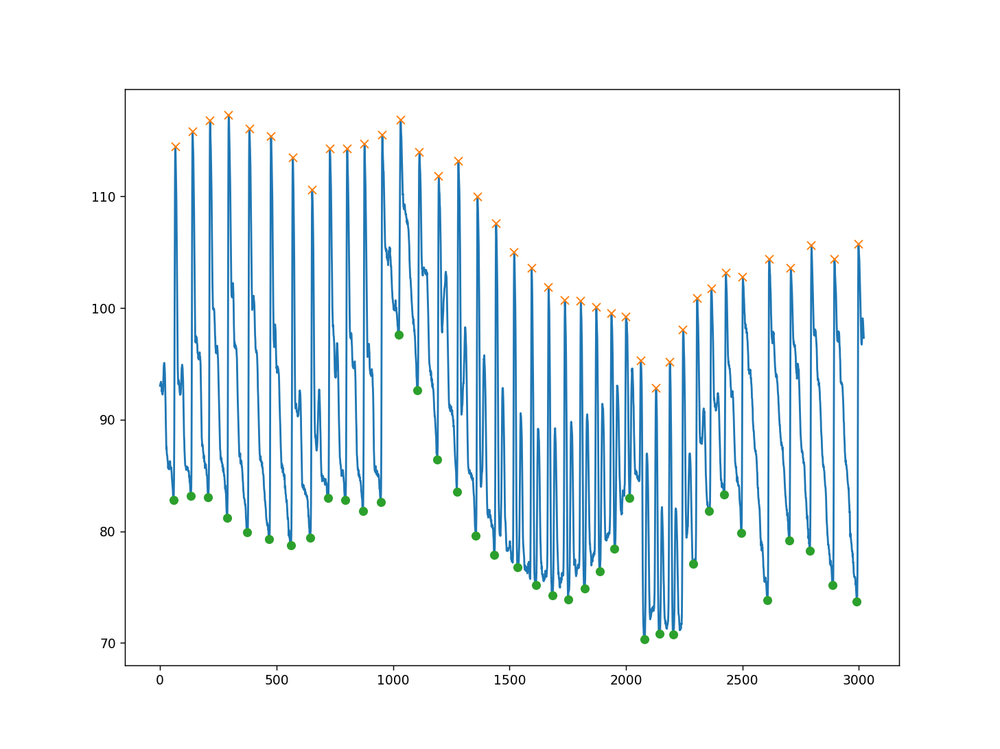

38

In [116]:
abp = df_wav['Pressure [mmHg]'].values[23468:26490]
plt.figure(figsize = (8,6))
plt.plot(abp)
sbp_loc = find_peaks(abp, distance = 50, height = 90, width = 2,prominence=1)[0]
dbp_loc = find_peaks(-1*abp, distance = 50, height = -105, width = 2)[0]
plt.plot(sbp_loc, abp[sbp_loc], 'x')
plt.plot(dbp_loc, abp[dbp_loc], 'o')
len(dbp_loc)

In [97]:
#200Hz 5s window = 1000samples
#2.5s overlapping step = 500samples
#calculate HR and PATpeak on each 5-second window

win = 1000#5s
step = 500#2.5s

hr_lis = []
pat_lis = []
sbp_lis = []
dbp_lis = []

for i in range(0, len(ecg_f) - win, 500):
    st_idx = i
    end_idx = i+win
    rpeaks = ecg.ecg(-1*ecg_f[st_idx:end_idx], sampling_rate=200.0, show=False)[2]
    if i==0:
        start_time = rpeaks[0]/200
    intervals = np.diff(rpeaks)/200
    hr = 60/np.mean(intervals)
    hr_lis.append(hr)
    info = nk.ppg_findpeaks(-1*ppg_f[st_idx:end_idx], sampling_rate=200, method='elgendi', show=False)
    ppeaks = info['PPG_Peaks']
    cor = np.where(ppeaks>=rpeaks[0])
    ppeaks_cor = ppeaks[cor]
    
    maxlen = min(len(ppeaks_cor),len(rpeaks) )
    pat = np.mean((ppeaks_cor[:maxlen] - rpeaks[:maxlen])/200)
    pat_lis.append(pat)
    
win_bp = 5*100
step_bp = 2.5*100

for i in range(0, len(abp)-500, int(step_bp)):
    st_idx = i
    end_idx = i+win
    sbp_loc = find_peaks(abp[st_idx:end_idx],  distance = 50, height = 90, width = 2,prominence=1)[0]
    sbp_mean = np.mean(abp[st_idx:end_idx][sbp_loc])
    sbp_lis.append(sbp_mean)
    
    dbp_loc = find_peaks(-1*abp[st_idx:end_idx], distance = 50, height = -105, width = 2)[0]
    dbp_mean = np.mean(abp[st_idx:end_idx][dbp_loc])
    dbp_lis.append(dbp_mean)

<IPython.core.display.Javascript object>


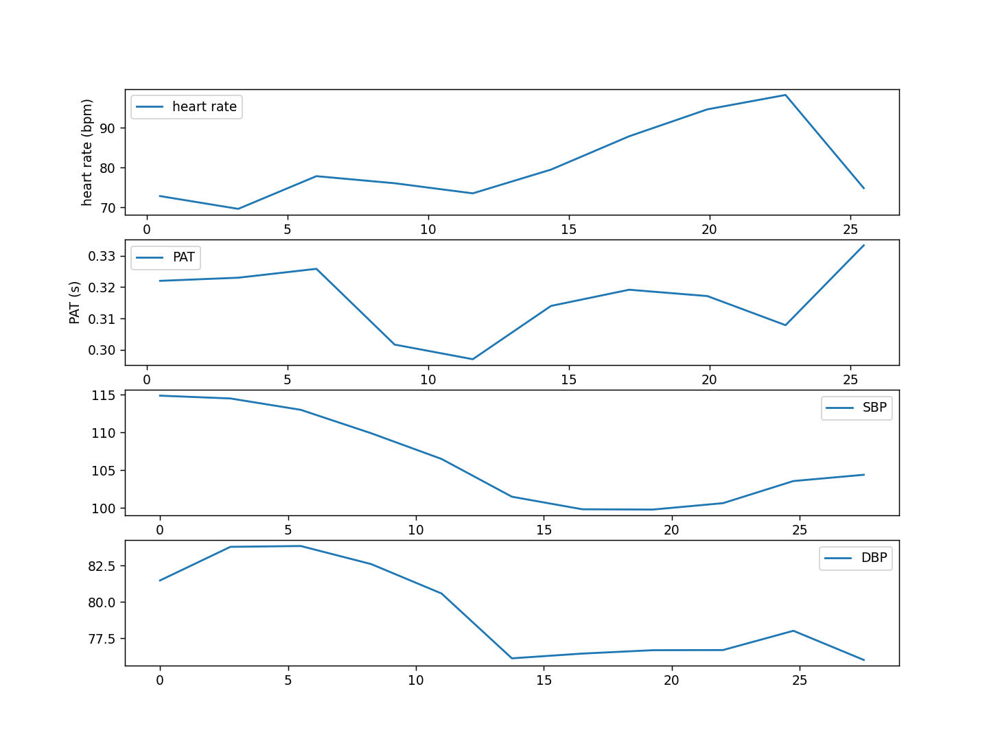

In [99]:
ts_hr = np.linspace(5/200+start_time,start_time+ 5/200+2.5*len(hr_lis), len(hr_lis))
ts_pat = np.linspace(start_time +5/200, start_time+5/200+2.5*len(pat_lis), len(pat_lis))
ts_sbp = np.linspace(0,2.5*len(sbp_lis), len(sbp_lis) )
ts_dbp = np.linspace(0,2.5*len(dbp_lis), len(dbp_lis))
fig, axs = plt.subplots(4,1,figsize = (8,6))
ax = axs[0]
#ax.set_title('valsalva maneuver 10s')
ax.plot(ts_hr, hr_lis, label = "heart rate")
ax.set_xlabel('time(s)');ax.set_ylabel('heart rate (bpm)')
ax.legend()

ax = axs[1]
ax.plot(ts_pat, pat_lis, label = "PAT")
#ax.axvline(x= 10, ls = ':', c = 'g', label = 'start')
#ax.axvline(x= , ls = '--', c = 'r', label = 'end')
ax.set_xlabel('time(s)'); ax.set_ylabel('PAT (s)')
ax.legend()

ax = axs[2]
ax.plot(ts_sbp,sbp_lis, label = 'SBP')
ax.legend()

ax= axs[3]
ax.plot(ts_dbp, dbp_lis, label = 'DBP')
ax.legend()

In [100]:
len(hr_lis)

10

In [101]:
len(sbp_lis)

11

In [102]:
df_1830 = pd.DataFrame({'hr':hr_lis, 'pat':pat_lis, 'sbp':sbp_lis[-10:], 'dbp':dbp_lis[-10:]})

In [103]:
df_1830

,hr,pat,sbp,dbp
0,72.815534,0.322000,114.501667,83.788333
1,69.605568,0.323000,112.996667,83.845000
2,77.821012,0.325833,109.900000,82.603333
3,76.045627,0.301667,106.499231,80.583077
4,73.506891,0.297000,101.499333,76.126429
5,79.470199,0.314000,99.840000,76.454000
6,87.847731,0.319167,99.800714,76.685000
7,94.612352,0.317143,100.647500,76.696154
8,98.226467,0.307857,103.574444,78.020000
9,74.812968,0.333333,104.403333,76.018000


In [104]:
df_1830.to_csv("1830.csv", index = False)

In [117]:
#1834
df_test= pd.read_csv('../carlos_ref_22/2022-02-02-18-34-31/CNAP_2022-02-02_19-31-44_001_beats.csv', delimiter = ';')
df_wav = pd.read_csv('../carlos_ref_22/2022-02-02-18-34-31/CNAP_2022-02-02_19-31-44_001_waveform.csv', delimiter = ';')
df_sen = pd.read_csv('../carlos_ref_22/2022-02-02-18-34-31/2022-02-02-18-34-31.csv', names = ['ts_ecg', 'ecg', 'ts_ppg', 'ppg'])


In [118]:
print(df_test[df_test['Event']=='Custom1'])

df_wav[df_wav['Time [s]']==123.49]
df_wav[df_wav['Time [s]']==153.86 ]

     Time [s]  Beat Sys [mmHg]  Beat Mean [mmHg]  Beat Dia [mmHg]  \
95     123.49              NaN               NaN              NaN   
133    153.86              NaN               NaN              NaN   

     Beat HR [bpm]  NBP Sys [mmHg]  NBP Dia [mmHg]    Event  \
95             NaN             NaN             NaN  Custom1   
133            NaN             NaN             NaN  Custom1   

     Height Offset [cm]  Unnamed: 9  
95                  NaN         NaN  
133                 NaN         NaN  


,Time [s],Pressure [mmHg],Unnamed: 2
15386,153.86,105.12,NaN


<IPython.core.display.Javascript object>


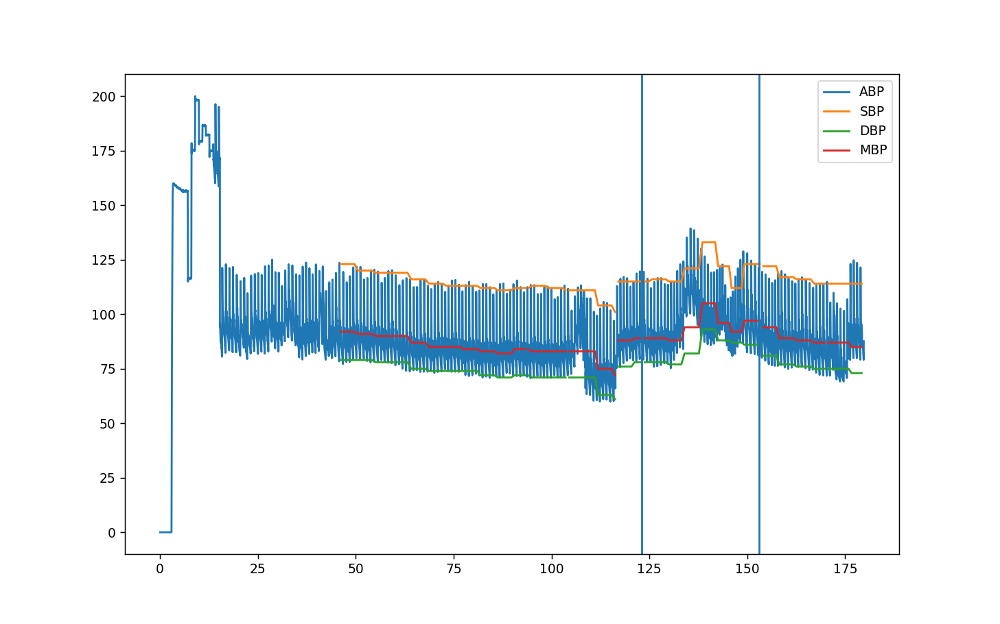

In [119]:
plt.figure(figsize = (8,5))
plt.plot(df_wav['Time [s]'], df_wav['Pressure [mmHg]'], label = 'ABP')
plt.plot(df_test['Time [s]'], df_test['Beat Sys [mmHg]'], label = 'SBP')
plt.plot(df_test['Time [s]'], df_test['Beat Dia [mmHg]'], label = 'DBP')
plt.plot(df_test['Time [s]'], df_test['Beat Mean [mmHg]'], label = 'MBP')
plt.axvline(x=123)
plt.axvline(x=153)
plt.legend()

<IPython.core.display.Javascript object>


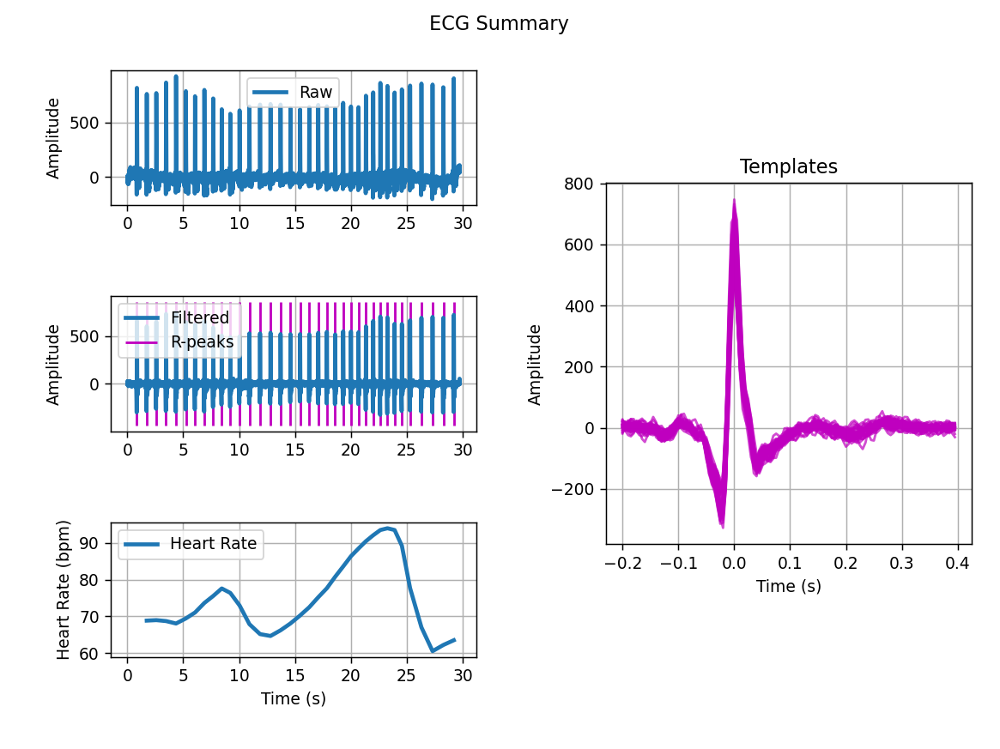

<IPython.core.display.Javascript object>


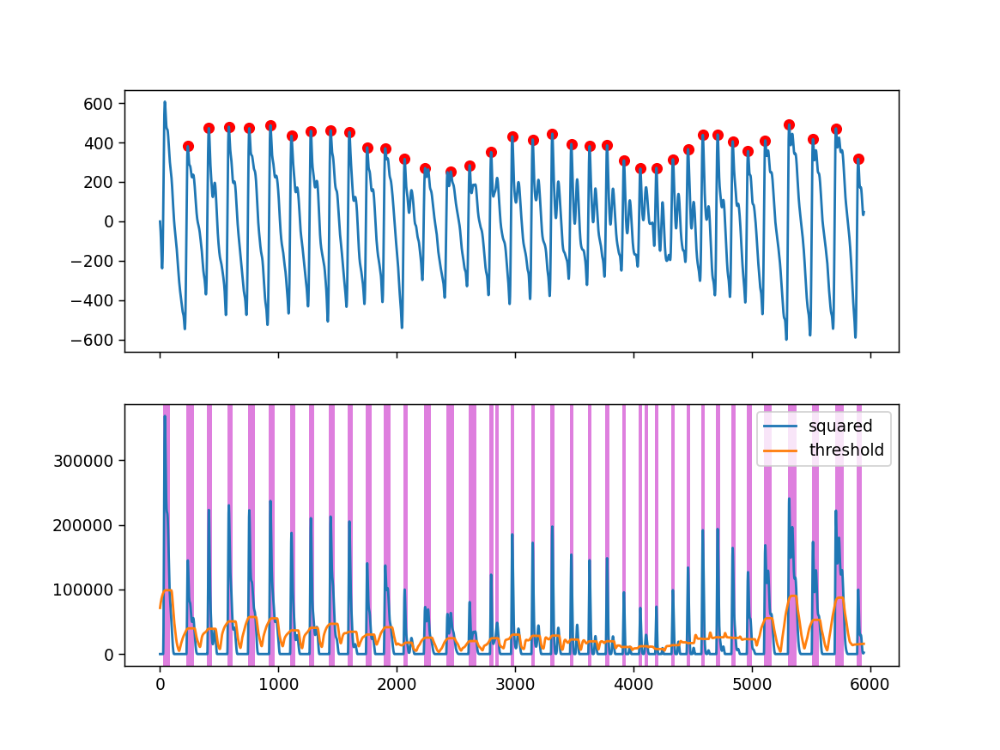

In [120]:
ecg_sen = df_sen['ecg'].values[5:]
ppg_sen = df_sen['ppg'].values[5:]

ecg_f = butter_filtering(ecg_sen, 200, [0.1, 50], 5, 'bandpass')
ppg_f = butter_filtering(ppg_sen, 200, [0.5, 10], 5, 'bandpass')

from biosppy.signals import ecg
ecg_feat = ecg.ecg(1*ecg_f, sampling_rate=200.0, show=True)
ts = ecg_feat[0]
filtered = ecg_feat[1]
rpeaks = ecg_feat[2]
templates_ts = ecg_feat[3]
templates = ecg_feat[4]
heart_rate_ts = ecg_feat[5]
heart_rate = ecg_feat[6]

import neurokit2 as nk
info = nk.ppg_findpeaks(-1*ppg_f, sampling_rate=200, method='elgendi', show=True)

<IPython.core.display.Javascript object>


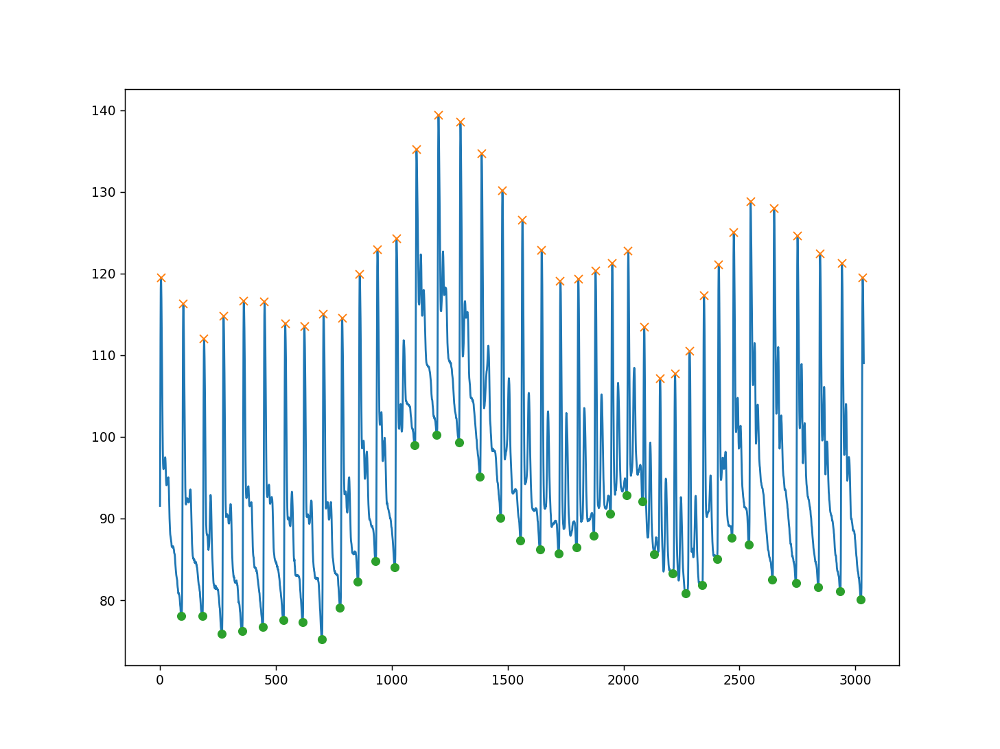

37

In [122]:
abp = df_wav['Pressure [mmHg]'].values[12349:15386]
plt.figure(figsize = (8,6))
plt.plot(abp)
sbp_loc = find_peaks(abp, distance = 50, height = 90, width = 2,prominence=1)[0]
dbp_loc = find_peaks(-1*abp, distance = 50, height = -105, width = 2, prominence = 1)[0]
plt.plot(sbp_loc, abp[sbp_loc], 'x')
plt.plot(dbp_loc, abp[dbp_loc], 'o')
len(dbp_loc)

In [123]:
#200Hz 5s window = 1000samples
#2.5s overlapping step = 500samples
#calculate HR and PATpeak on each 5-second window

win = 1000#5s
step = 500#2.5s

hr_lis = []
pat_lis = []
sbp_lis = []
dbp_lis = []

for i in range(0, len(ecg_f) - win, 500):
    st_idx = i
    end_idx = i+win
    rpeaks = ecg.ecg(-1*ecg_f[st_idx:end_idx], sampling_rate=200.0, show=False)[2]
    if i==0:
        start_time = rpeaks[0]/200
    intervals = np.diff(rpeaks)/200
    hr = 60/np.mean(intervals)
    hr_lis.append(hr)
    info = nk.ppg_findpeaks(-1*ppg_f[st_idx:end_idx], sampling_rate=200, method='elgendi', show=False)
    ppeaks = info['PPG_Peaks']
    cor = np.where(ppeaks>=rpeaks[0])
    ppeaks_cor = ppeaks[cor]
    
    maxlen = min(len(ppeaks_cor),len(rpeaks) )
    pat = np.mean((ppeaks_cor[:maxlen] - rpeaks[:maxlen])/200)
    pat_lis.append(pat)
    
win_bp = 5*100
step_bp = 2.5*100

for i in range(0, len(abp)-500, int(step_bp)):
    st_idx = i
    end_idx = i+win
    sbp_loc = find_peaks(abp[st_idx:end_idx],  distance = 50, height = 90, width = 2,prominence=1)[0]
    sbp_mean = np.mean(abp[st_idx:end_idx][sbp_loc])
    sbp_lis.append(sbp_mean)
    
    dbp_loc = find_peaks(-1*abp[st_idx:end_idx], distance = 50, height = -105, width = 2, prominence = 1)[0]
    dbp_mean = np.mean(abp[st_idx:end_idx][dbp_loc])
    dbp_lis.append(dbp_mean)
print(len(hr_lis), len(sbp_lis))

<IPython.core.display.Javascript object>


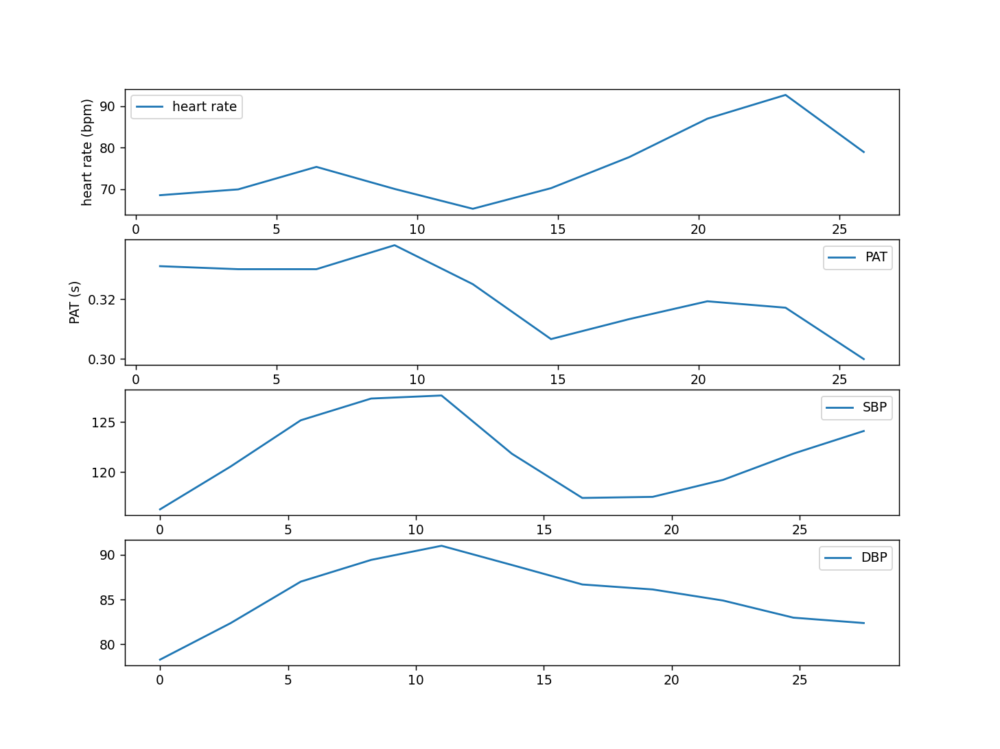

In [124]:
ts_hr = np.linspace(5/200+start_time,start_time+ 5/200+2.5*len(hr_lis), len(hr_lis))
ts_pat = np.linspace(start_time +5/200, start_time+5/200+2.5*len(pat_lis), len(pat_lis))
ts_sbp = np.linspace(0,2.5*len(sbp_lis), len(sbp_lis) )
ts_dbp = np.linspace(0,2.5*len(dbp_lis), len(dbp_lis))
fig, axs = plt.subplots(4,1,figsize = (8,6))
ax = axs[0]
#ax.set_title('valsalva maneuver 10s')
ax.plot(ts_hr, hr_lis, label = "heart rate")
ax.set_xlabel('time(s)');ax.set_ylabel('heart rate (bpm)')
ax.legend()

ax = axs[1]
ax.plot(ts_pat, pat_lis, label = "PAT")
#ax.axvline(x= 10, ls = ':', c = 'g', label = 'start')
#ax.axvline(x= , ls = '--', c = 'r', label = 'end')
ax.set_xlabel('time(s)'); ax.set_ylabel('PAT (s)')
ax.legend()

ax = axs[2]
ax.plot(ts_sbp,sbp_lis, label = 'SBP')
ax.legend()

ax= axs[3]
ax.plot(ts_dbp, dbp_lis, label = 'DBP')
ax.legend()

In [127]:
df_1834 = pd.DataFrame({'hr':hr_lis, 'pat':pat_lis, 'sbp':sbp_lis[-10:], 'dbp':dbp_lis[-10:]})
df_1834

,hr,pat,sbp,dbp
0,68.571429,0.331000,120.540833,82.350833
1,69.970845,0.330000,125.156667,86.995833
2,75.376884,0.330000,127.320000,89.423333
3,70.072993,0.338000,127.622500,90.998333
4,65.306122,0.325000,121.824615,88.854615
5,70.257611,0.306667,117.426000,86.680000
6,77.720207,0.313333,117.532857,86.122857
7,86.956522,0.319286,119.223846,84.886923
8,92.664093,0.317143,121.838000,82.973000
9,78.947368,0.300000,124.088333,82.373333


In [128]:
df_1834.to_csv("1834.csv", index = False)

In [129]:
#1848
df_test= pd.read_csv('../carlos_ref_22/2022-02-02-18-48-58/CNAP_2022-02-02_19-46-07_001_beats.csv', delimiter = ';')
df_wav = pd.read_csv('../carlos_ref_22/2022-02-02-18-48-58/CNAP_2022-02-02_19-46-07_001_waveform.csv', delimiter = ';')
df_sen = pd.read_csv('../carlos_ref_22/2022-02-02-18-48-58/2022-02-02-18-48-58.csv', names = ['ts_ecg', 'ecg', 'ts_ppg', 'ppg'])


In [131]:
print(df_test[df_test['Event']=='Custom1'])

df_wav[df_wav['Time [s]']==127.50]
df_wav[df_wav['Time [s]']==157.91]

     Time [s]  Beat Sys [mmHg]  Beat Mean [mmHg]  Beat Dia [mmHg]  \
108    127.50              NaN               NaN              NaN   
137    149.97              NaN               NaN              NaN   
138    150.12              NaN               NaN              NaN   
149    157.91              NaN               NaN              NaN   

     Beat HR [bpm]  NBP Sys [mmHg]  NBP Dia [mmHg]    Event  \
108            NaN             NaN             NaN  Custom1   
137            NaN             NaN             NaN  Custom1   
138            NaN             NaN             NaN  Custom1   
149            NaN             NaN             NaN  Custom1   

     Height Offset [cm]  Unnamed: 9  
108                 NaN         NaN  
137                 NaN         NaN  
138                 NaN         NaN  
149                 NaN         NaN  


,Time [s],Pressure [mmHg],Unnamed: 2
15791,157.91,77.8,NaN


<IPython.core.display.Javascript object>


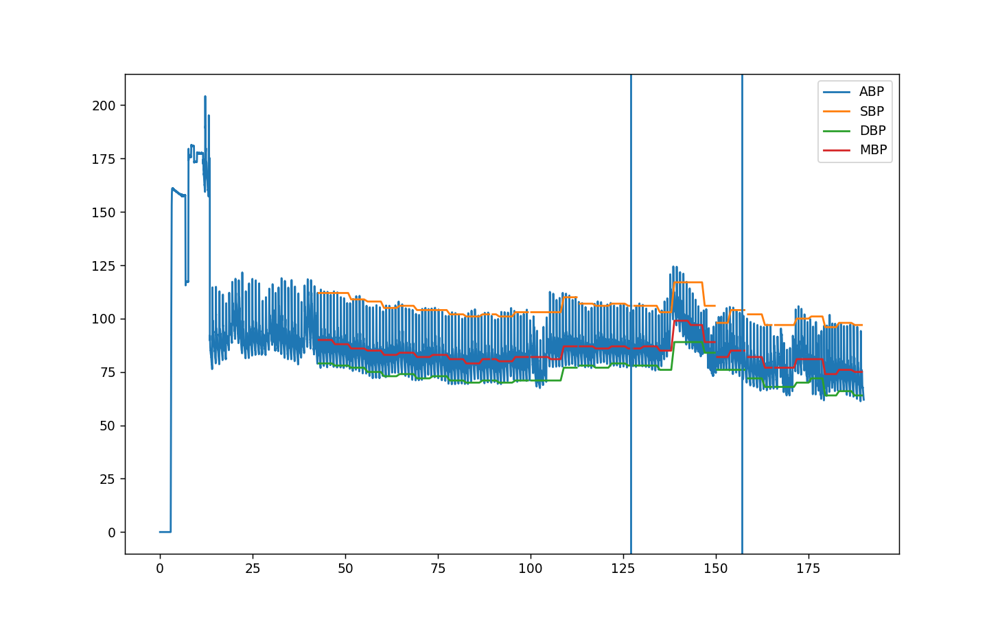

In [132]:
plt.figure(figsize = (8,5))
plt.plot(df_wav['Time [s]'], df_wav['Pressure [mmHg]'], label = 'ABP')
plt.plot(df_test['Time [s]'], df_test['Beat Sys [mmHg]'], label = 'SBP')
plt.plot(df_test['Time [s]'], df_test['Beat Dia [mmHg]'], label = 'DBP')
plt.plot(df_test['Time [s]'], df_test['Beat Mean [mmHg]'], label = 'MBP')
plt.axvline(x=127)
plt.axvline(x=157)
plt.legend()

<IPython.core.display.Javascript object>


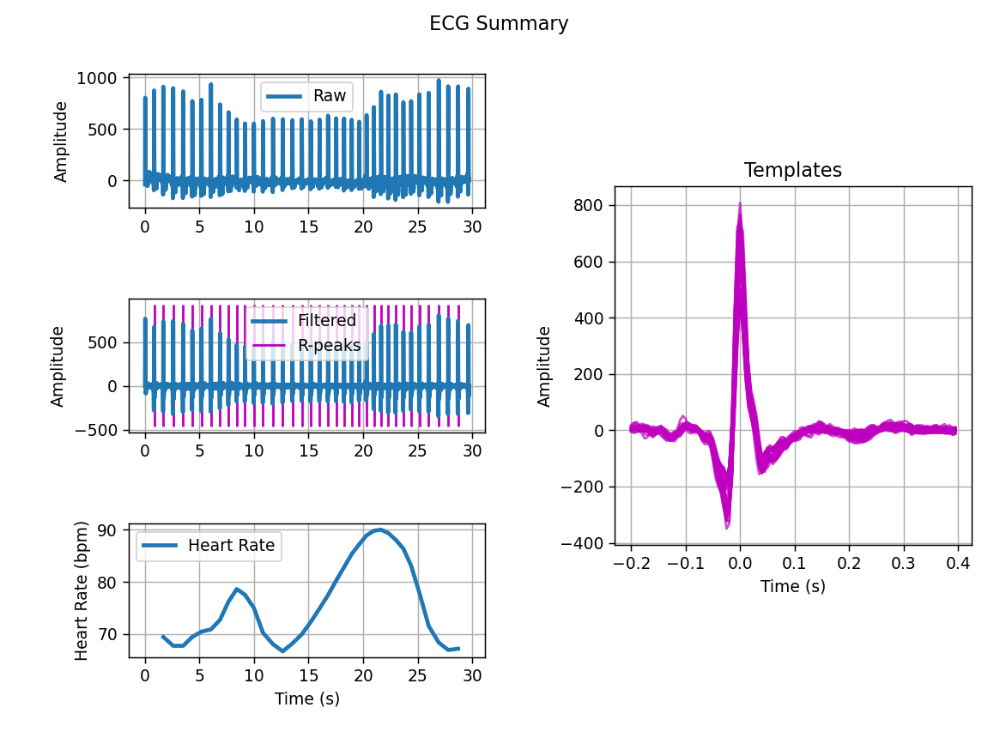

<IPython.core.display.Javascript object>


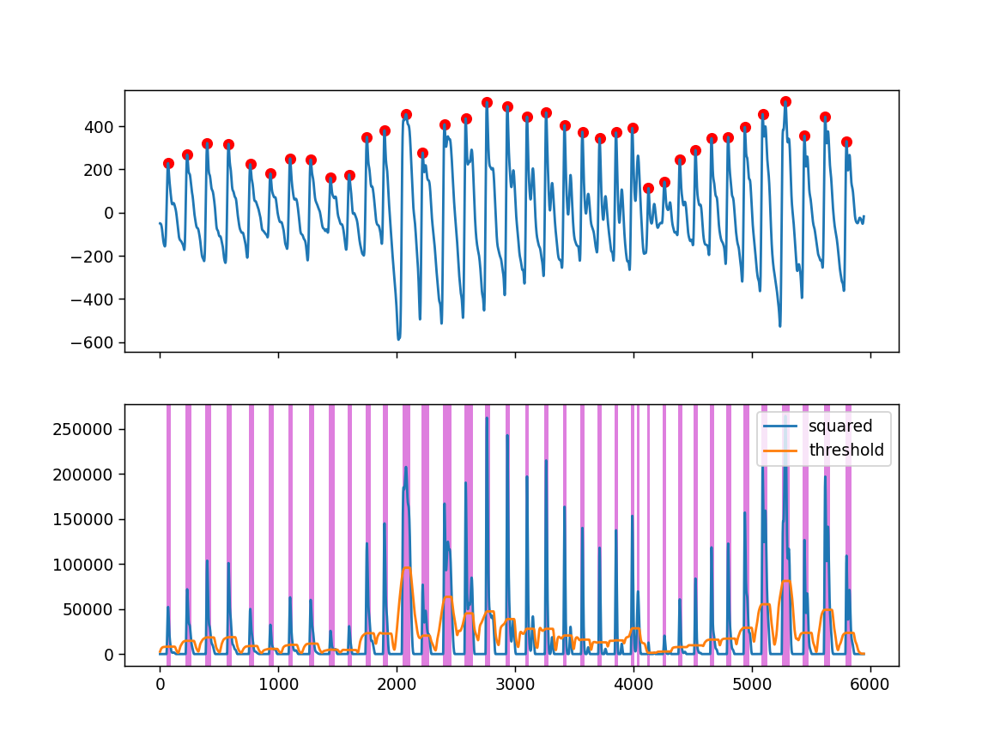

In [133]:
ecg_sen = df_sen['ecg'].values[5:]
ppg_sen = df_sen['ppg'].values[5:]

ecg_f = butter_filtering(ecg_sen, 200, [0.1, 50], 5, 'bandpass')
ppg_f = butter_filtering(ppg_sen, 200, [0.5, 10], 5, 'bandpass')

from biosppy.signals import ecg
ecg_feat = ecg.ecg(1*ecg_f, sampling_rate=200.0, show=True)
ts = ecg_feat[0]
filtered = ecg_feat[1]
rpeaks = ecg_feat[2]
templates_ts = ecg_feat[3]
templates = ecg_feat[4]
heart_rate_ts = ecg_feat[5]
heart_rate = ecg_feat[6]

import neurokit2 as nk
info = nk.ppg_findpeaks(-1*ppg_f, sampling_rate=200, method='elgendi', show=True)

C:\Users\HP\AppData\Local\Temp/ipykernel_8312/1450928720.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (8,6))


<IPython.core.display.Javascript object>


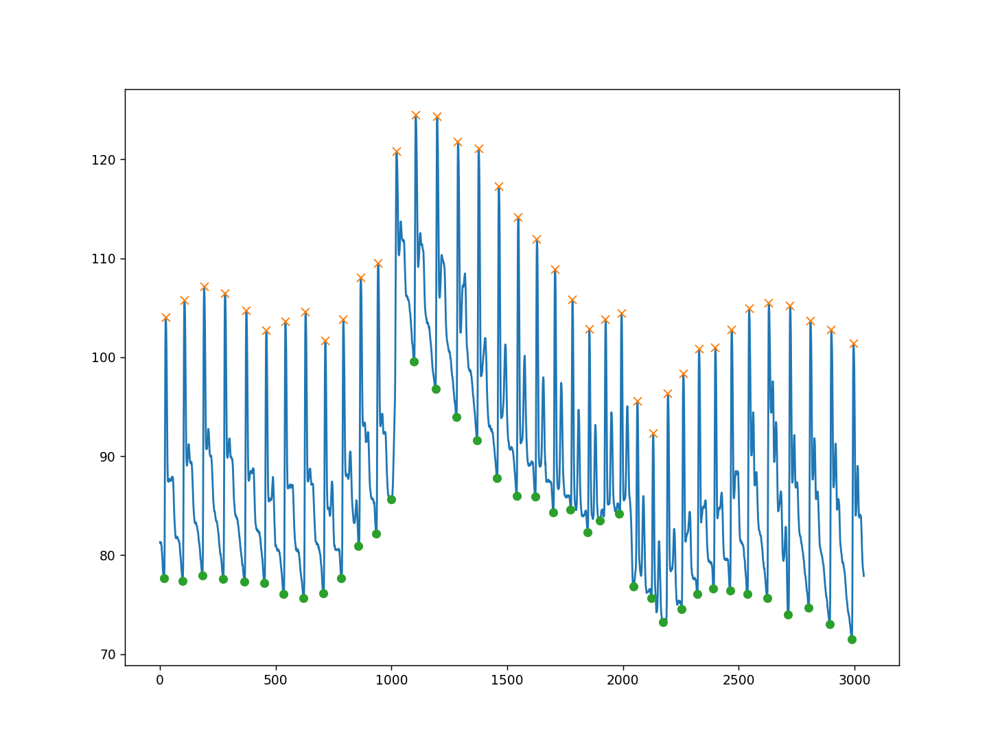

38

In [134]:
abp = df_wav['Pressure [mmHg]'].values[12750:15791]
plt.figure(figsize = (8,6))
plt.plot(abp)
sbp_loc = find_peaks(abp, distance = 50, height = 90, width = 2,prominence=1)[0]
dbp_loc = find_peaks(-1*abp, distance = 50, height = -105, width = 2, prominence = 1)[0]
plt.plot(sbp_loc, abp[sbp_loc], 'x')
plt.plot(dbp_loc, abp[dbp_loc], 'o')
len(dbp_loc)

In [135]:
#200Hz 5s window = 1000samples
#2.5s overlapping step = 500samples
#calculate HR and PATpeak on each 5-second window

win = 1000#5s
step = 500#2.5s

hr_lis = []
pat_lis = []
sbp_lis = []
dbp_lis = []

for i in range(0, len(ecg_f) - win, 500):
    st_idx = i
    end_idx = i+win
    rpeaks = ecg.ecg(-1*ecg_f[st_idx:end_idx], sampling_rate=200.0, show=False)[2]
    if i==0:
        start_time = rpeaks[0]/200
    intervals = np.diff(rpeaks)/200
    hr = 60/np.mean(intervals)
    hr_lis.append(hr)
    info = nk.ppg_findpeaks(-1*ppg_f[st_idx:end_idx], sampling_rate=200, method='elgendi', show=False)
    ppeaks = info['PPG_Peaks']
    cor = np.where(ppeaks>=rpeaks[0])
    ppeaks_cor = ppeaks[cor]
    
    maxlen = min(len(ppeaks_cor),len(rpeaks) )
    pat = np.mean((ppeaks_cor[:maxlen] - rpeaks[:maxlen])/200)
    pat_lis.append(pat)
    
win_bp = 5*100
step_bp = 2.5*100

for i in range(0, len(abp)-500, int(step_bp)):
    st_idx = i
    end_idx = i+win
    sbp_loc = find_peaks(abp[st_idx:end_idx],  distance = 50, height = 90, width = 2,prominence=1)[0]
    sbp_mean = np.mean(abp[st_idx:end_idx][sbp_loc])
    sbp_lis.append(sbp_mean)
    
    dbp_loc = find_peaks(-1*abp[st_idx:end_idx], distance = 50, height = -105, width = 2, prominence = 1)[0]
    dbp_mean = np.mean(abp[st_idx:end_idx][dbp_loc])
    dbp_lis.append(dbp_mean)
print(len(hr_lis), len(sbp_lis))

10 11


<IPython.core.display.Javascript object>


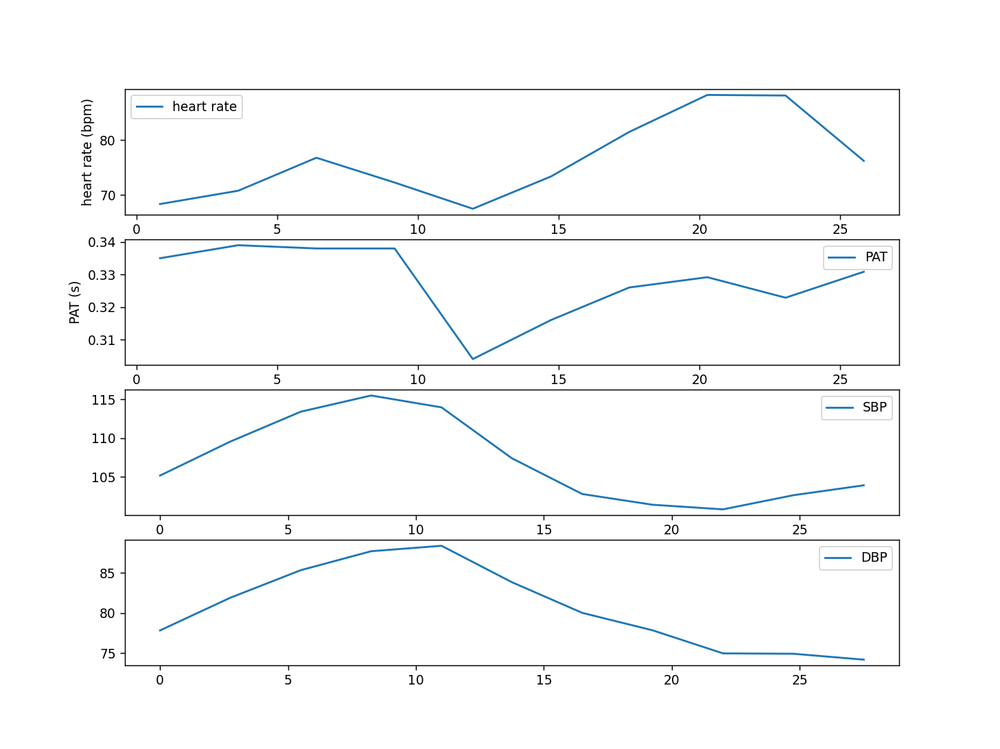

In [136]:
ts_hr = np.linspace(5/200+start_time,start_time+ 5/200+2.5*len(hr_lis), len(hr_lis))
ts_pat = np.linspace(start_time +5/200, start_time+5/200+2.5*len(pat_lis), len(pat_lis))
ts_sbp = np.linspace(0,2.5*len(sbp_lis), len(sbp_lis) )
ts_dbp = np.linspace(0,2.5*len(dbp_lis), len(dbp_lis))
fig, axs = plt.subplots(4,1,figsize = (8,6))
ax = axs[0]
#ax.set_title('valsalva maneuver 10s')
ax.plot(ts_hr, hr_lis, label = "heart rate")
ax.set_xlabel('time(s)');ax.set_ylabel('heart rate (bpm)')
ax.legend()

ax = axs[1]
ax.plot(ts_pat, pat_lis, label = "PAT")
#ax.axvline(x= 10, ls = ':', c = 'g', label = 'start')
#ax.axvline(x= , ls = '--', c = 'r', label = 'end')
ax.set_xlabel('time(s)'); ax.set_ylabel('PAT (s)')
ax.legend()

ax = axs[2]
ax.plot(ts_sbp,sbp_lis, label = 'SBP')
ax.legend()

ax= axs[3]
ax.plot(ts_dbp, dbp_lis, label = 'DBP')
ax.legend()

In [137]:
df_1848 = pd.DataFrame({'hr':hr_lis, 'pat':pat_lis, 'sbp':sbp_lis[-10:], 'dbp':dbp_lis[-10:]})
df_1848

,hr,pat,sbp,dbp
0,68.376068,0.335000,109.549167,81.910833
1,70.796460,0.339000,113.400000,85.346667
2,76.800000,0.338000,115.489167,87.711667
3,72.289157,0.338000,113.955385,88.390833
4,67.510549,0.304000,107.389231,83.844615
5,73.394495,0.316000,102.773571,80.016429
6,81.494058,0.326000,101.390714,77.838571
7,88.235294,0.329167,100.796923,74.957692
8,88.127295,0.322857,102.621000,74.912222
9,76.238882,0.330833,103.898333,74.178333


In [138]:
df_1848.to_csv("1848.csv", index = False)

In [140]:
#1901
df_test= pd.read_csv('../carlos_ref_22/2022-02-02-19-01-27/CNAP_2022-02-02_19-57-50_001_beats.csv', delimiter = ';')
df_wav = pd.read_csv('../carlos_ref_22/2022-02-02-19-01-27/CNAP_2022-02-02_19-57-50_001_waveform.csv', delimiter = ';')
df_sen = pd.read_csv('../carlos_ref_22/2022-02-02-19-01-27/2022-02-02-19-01-27.csv', names = ['ts_ecg', 'ecg', 'ts_ppg', 'ppg'])

In [142]:
print(df_test[df_test['Event']=='Custom1'])

df_wav[df_wav['Time [s]']==173.93]
df_wav[df_wav['Time [s]']==233.89]

     Time [s]  Beat Sys [mmHg]  Beat Mean [mmHg]  Beat Dia [mmHg]  \
160    173.93              NaN               NaN              NaN   
239    233.89              NaN               NaN              NaN   

     Beat HR [bpm]  NBP Sys [mmHg]  NBP Dia [mmHg]    Event  \
160            NaN             NaN             NaN  Custom1   
239            NaN             NaN             NaN  Custom1   

     Height Offset [cm]  Unnamed: 9  
160                 NaN         NaN  
239                 NaN         NaN  


,Time [s],Pressure [mmHg],Unnamed: 2
23389,233.89,83.31,NaN


<IPython.core.display.Javascript object>


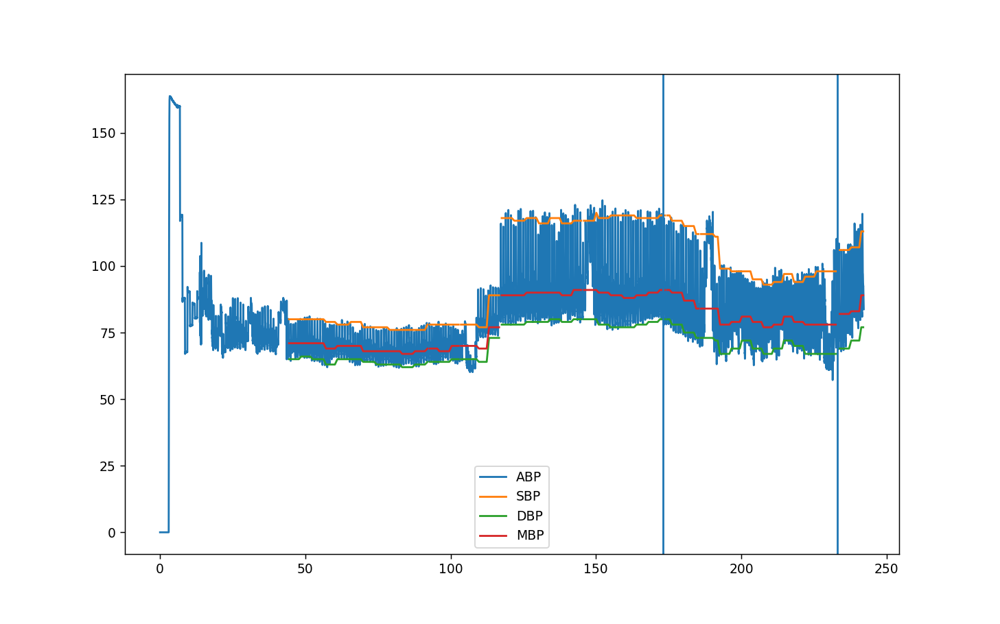

In [143]:
plt.figure(figsize = (8,5))
plt.plot(df_wav['Time [s]'], df_wav['Pressure [mmHg]'], label = 'ABP')
plt.plot(df_test['Time [s]'], df_test['Beat Sys [mmHg]'], label = 'SBP')
plt.plot(df_test['Time [s]'], df_test['Beat Dia [mmHg]'], label = 'DBP')
plt.plot(df_test['Time [s]'], df_test['Beat Mean [mmHg]'], label = 'MBP')
plt.axvline(x=173)
plt.axvline(x=233)
plt.legend()

<IPython.core.display.Javascript object>


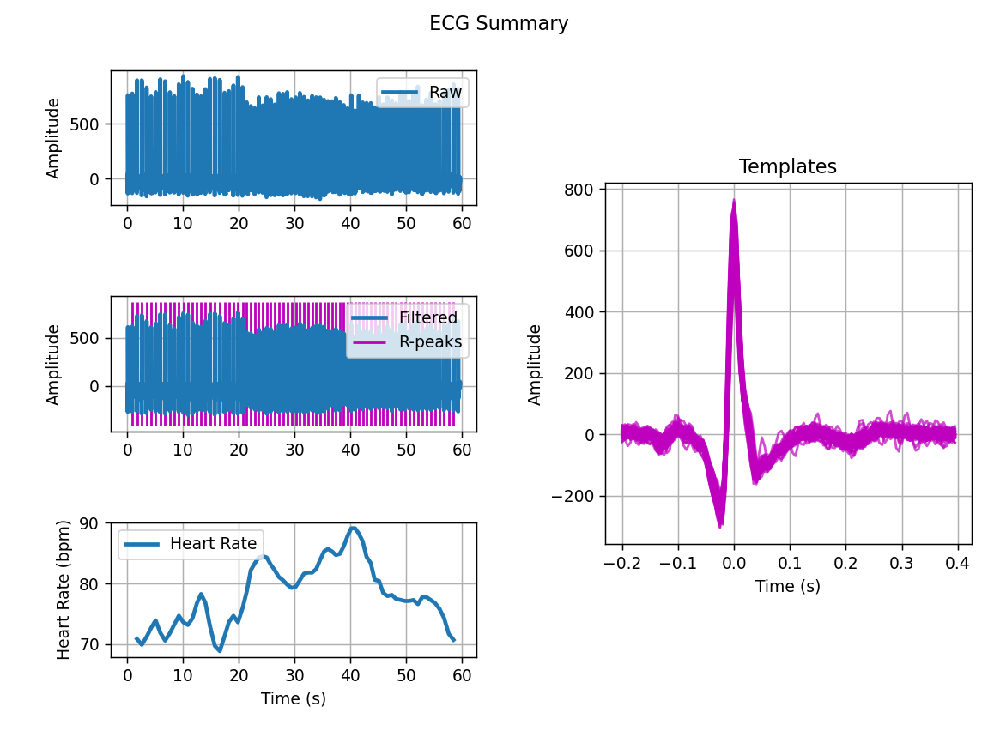

<IPython.core.display.Javascript object>


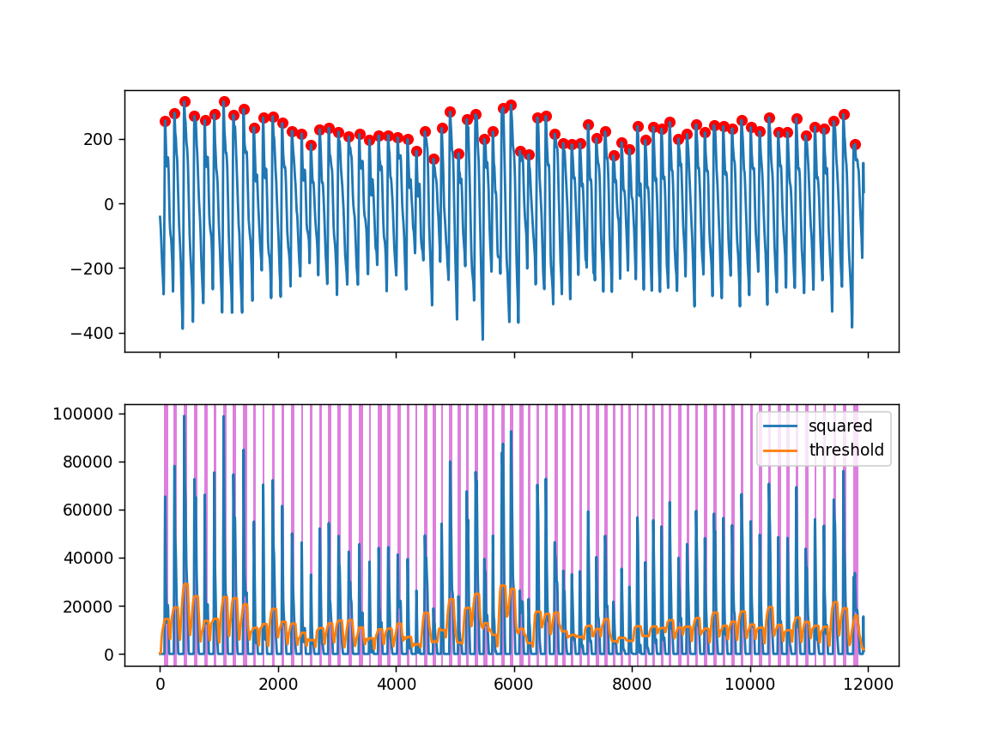

In [144]:
ecg_sen = df_sen['ecg'].values[5:]
ppg_sen = df_sen['ppg'].values[5:]

ecg_f = butter_filtering(ecg_sen, 200, [0.1, 50], 5, 'bandpass')
ppg_f = butter_filtering(ppg_sen, 200, [0.5, 10], 5, 'bandpass')

from biosppy.signals import ecg
ecg_feat = ecg.ecg(1*ecg_f, sampling_rate=200.0, show=True)
ts = ecg_feat[0]
filtered = ecg_feat[1]
rpeaks = ecg_feat[2]
templates_ts = ecg_feat[3]
templates = ecg_feat[4]
heart_rate_ts = ecg_feat[5]
heart_rate = ecg_feat[6]

import neurokit2 as nk
info = nk.ppg_findpeaks(-1*ppg_f, sampling_rate=200, method='elgendi', show=True)

<IPython.core.display.Javascript object>


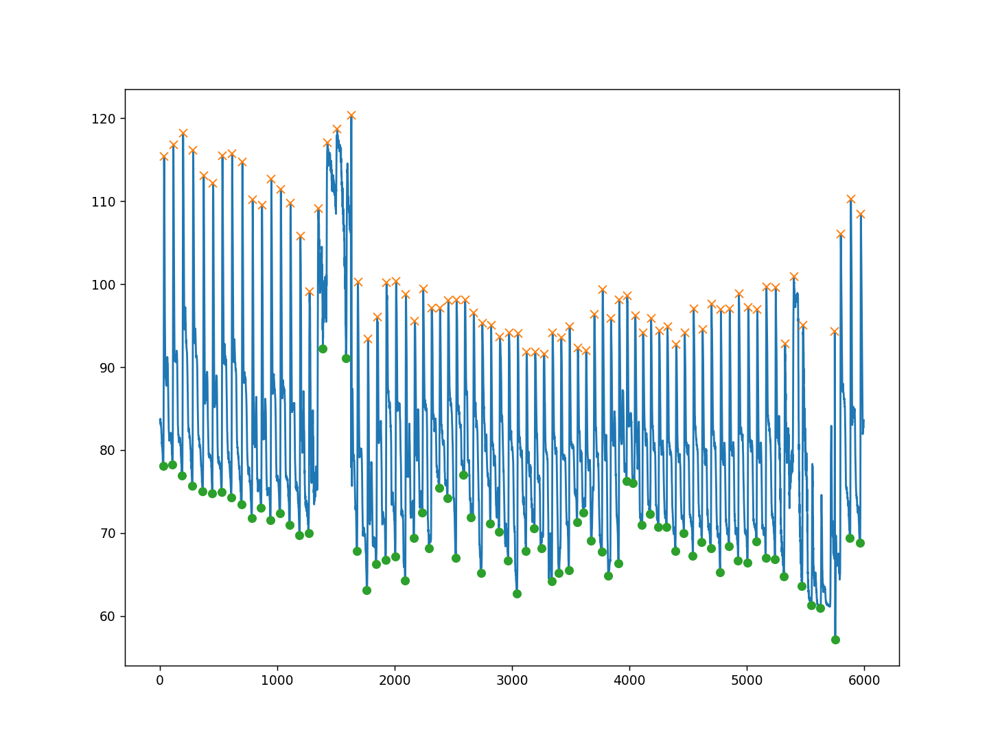

74

In [150]:
abp = df_wav['Pressure [mmHg]'].values[17393:23389]
plt.figure(figsize = (8,6))
plt.plot(abp)
sbp_loc = find_peaks(abp, distance = 50, height = 80,prominence=1)[0]
dbp_loc = find_peaks(-1*abp, distance = 50, height = -105, width = 2, prominence = 1)[0]
plt.plot(sbp_loc, abp[sbp_loc], 'x')
plt.plot(dbp_loc, abp[dbp_loc], 'o')
len(dbp_loc)

In [151]:
#200Hz 5s window = 1000samples
#2.5s overlapping step = 500samples
#calculate HR and PATpeak on each 5-second window

win = 1000#5s
step = 500#2.5s

hr_lis = []
pat_lis = []
sbp_lis = []
dbp_lis = []

for i in range(0, len(ecg_f) - win, 500):
    st_idx = i
    end_idx = i+win
    rpeaks = ecg.ecg(-1*ecg_f[st_idx:end_idx], sampling_rate=200.0, show=False)[2]
    if i==0:
        start_time = rpeaks[0]/200
    intervals = np.diff(rpeaks)/200
    hr = 60/np.mean(intervals)
    hr_lis.append(hr)
    info = nk.ppg_findpeaks(-1*ppg_f[st_idx:end_idx], sampling_rate=200, method='elgendi', show=False)
    ppeaks = info['PPG_Peaks']
    cor = np.where(ppeaks>=rpeaks[0])
    ppeaks_cor = ppeaks[cor]
    
    maxlen = min(len(ppeaks_cor),len(rpeaks) )
    pat = np.mean((ppeaks_cor[:maxlen] - rpeaks[:maxlen])/200)
    pat_lis.append(pat)
    
win_bp = 5*100
step_bp = 2.5*100

for i in range(0, len(abp)-500, int(step_bp)):
    st_idx = i
    end_idx = i+win
    sbp_loc = find_peaks(abp[st_idx:end_idx],  distance = 50, height = 80, width = 1,prominence=1)[0]
    sbp_mean = np.mean(abp[st_idx:end_idx][sbp_loc])
    sbp_lis.append(sbp_mean)
    
    dbp_loc = find_peaks(-1*abp[st_idx:end_idx], distance = 50, height = -105, width = 2, prominence = 1)[0]
    dbp_mean = np.mean(abp[st_idx:end_idx][dbp_loc])
    dbp_lis.append(dbp_mean)
print(len(hr_lis), len(sbp_lis))

22 22


<IPython.core.display.Javascript object>


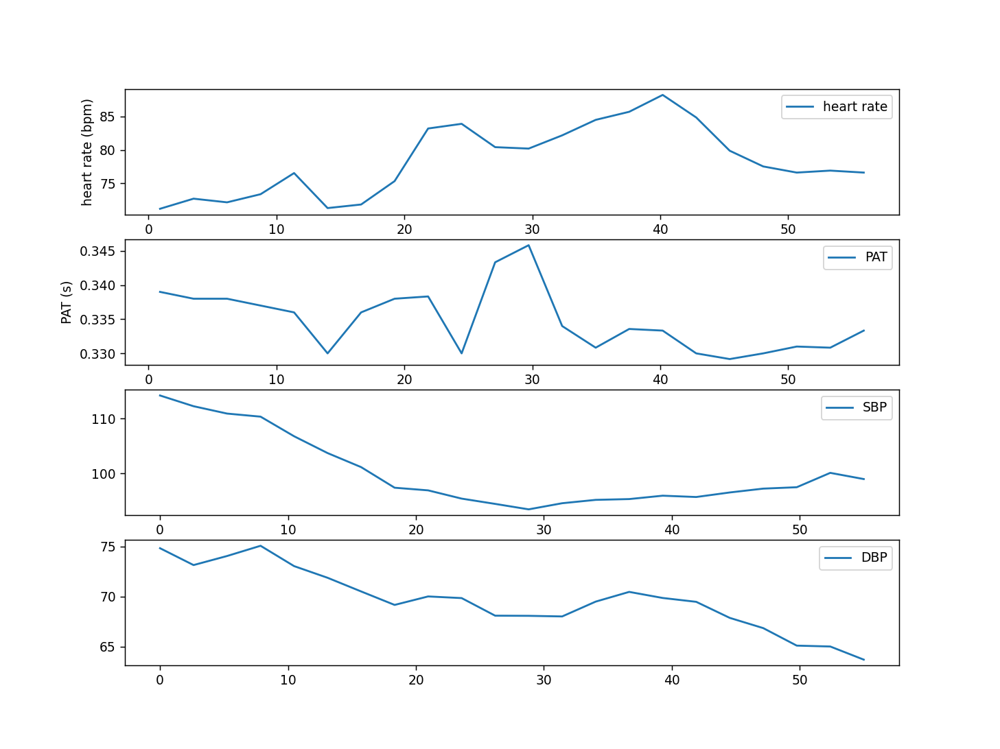

In [152]:
ts_hr = np.linspace(5/200+start_time,start_time+ 5/200+2.5*len(hr_lis), len(hr_lis))
ts_pat = np.linspace(start_time +5/200, start_time+5/200+2.5*len(pat_lis), len(pat_lis))
ts_sbp = np.linspace(0,2.5*len(sbp_lis), len(sbp_lis) )
ts_dbp = np.linspace(0,2.5*len(dbp_lis), len(dbp_lis))
fig, axs = plt.subplots(4,1,figsize = (8,6))
ax = axs[0]
#ax.set_title('valsalva maneuver 10s')
ax.plot(ts_hr, hr_lis, label = "heart rate")
ax.set_xlabel('time(s)');ax.set_ylabel('heart rate (bpm)')
ax.legend()

ax = axs[1]
ax.plot(ts_pat, pat_lis, label = "PAT")
#ax.axvline(x= 10, ls = ':', c = 'g', label = 'start')
#ax.axvline(x= , ls = '--', c = 'r', label = 'end')
ax.set_xlabel('time(s)'); ax.set_ylabel('PAT (s)')
ax.legend()

ax = axs[2]
ax.plot(ts_sbp,sbp_lis, label = 'SBP')
ax.legend()

ax= axs[3]
ax.plot(ts_dbp, dbp_lis, label = 'DBP')
ax.legend()

In [153]:
df_1901 = pd.DataFrame({'hr':hr_lis[-21:], 'pat':pat_lis[-21:], 'sbp':sbp_lis[-21:], 'dbp':dbp_lis[-21:]})
df_1901

,hr,pat,sbp,dbp
0,72.727273,0.338000,112.236667,73.140833
1,72.180451,0.338000,110.897500,74.045455
2,73.394495,0.337000,110.337500,75.066000
3,76.555024,0.336000,106.773333,73.037000
4,71.322437,0.330000,103.714615,71.871818
5,71.856287,0.336000,101.162308,70.509167
6,75.353218,0.338000,97.416429,69.162857
7,83.217753,0.338333,96.934286,70.009286
8,83.916084,0.330000,95.433846,69.845385
9,80.428954,0.343333,94.473571,68.089286


In [154]:
df_1901.to_csv("1901_fb.csv", index = False)

In [155]:
#1918
df_test= pd.read_csv('../carlos_ref_22/2022-02-02-19-18-04/CNAP_2022-02-02_20-15-04_001_beats.csv', delimiter = ';')
df_wav = pd.read_csv('../carlos_ref_22/2022-02-02-19-18-04/CNAP_2022-02-02_20-15-04_001_waveform.csv', delimiter = ';')
df_sen = pd.read_csv('../carlos_ref_22/2022-02-02-19-18-04/2022-02-02-19-18-04.csv', names = ['ts_ecg', 'ecg', 'ts_ppg', 'ppg'])

In [157]:
print(df_test[df_test['Event']=='Custom1'])

df_wav[df_wav['Time [s]']==136.91]
df_wav[df_wav['Time [s]']==197.78]

     Time [s]  Beat Sys [mmHg]  Beat Mean [mmHg]  Beat Dia [mmHg]  \
118    136.91              NaN               NaN              NaN   
199    197.78              NaN               NaN              NaN   

     Beat HR [bpm]  NBP Sys [mmHg]  NBP Dia [mmHg]    Event  \
118            NaN             NaN             NaN  Custom1   
199            NaN             NaN             NaN  Custom1   

     Height Offset [cm]  Unnamed: 9  
118                 NaN         NaN  
199                 NaN         NaN  


,Time [s],Pressure [mmHg],Unnamed: 2
19778,197.78,83.0,NaN


<IPython.core.display.Javascript object>


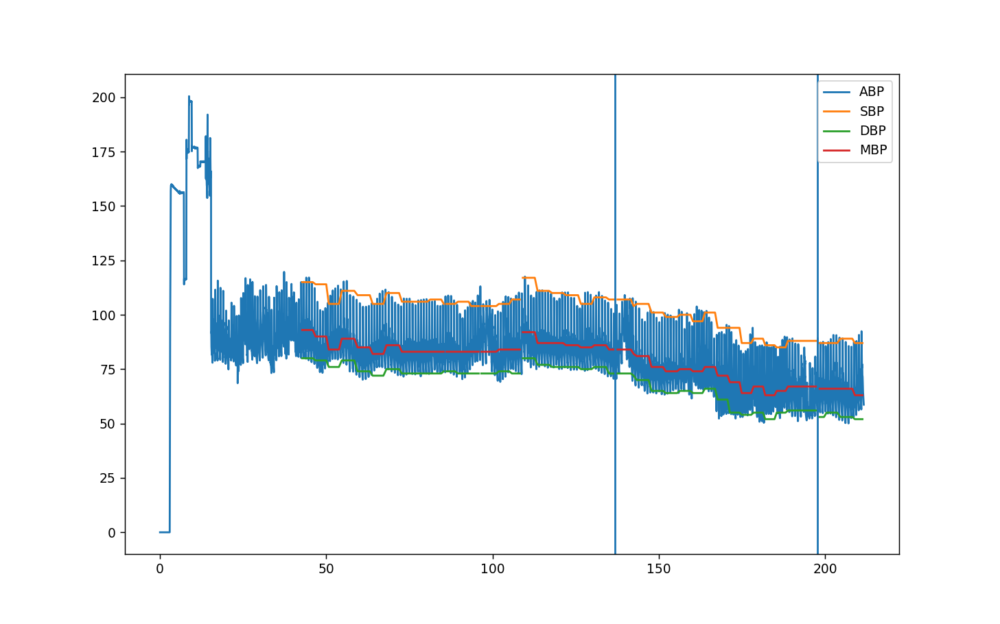

In [158]:
plt.figure(figsize = (8,5))
plt.plot(df_wav['Time [s]'], df_wav['Pressure [mmHg]'], label = 'ABP')
plt.plot(df_test['Time [s]'], df_test['Beat Sys [mmHg]'], label = 'SBP')
plt.plot(df_test['Time [s]'], df_test['Beat Dia [mmHg]'], label = 'DBP')
plt.plot(df_test['Time [s]'], df_test['Beat Mean [mmHg]'], label = 'MBP')
plt.axvline(x=136.91)
plt.axvline(x=197.78)
plt.legend()

<IPython.core.display.Javascript object>


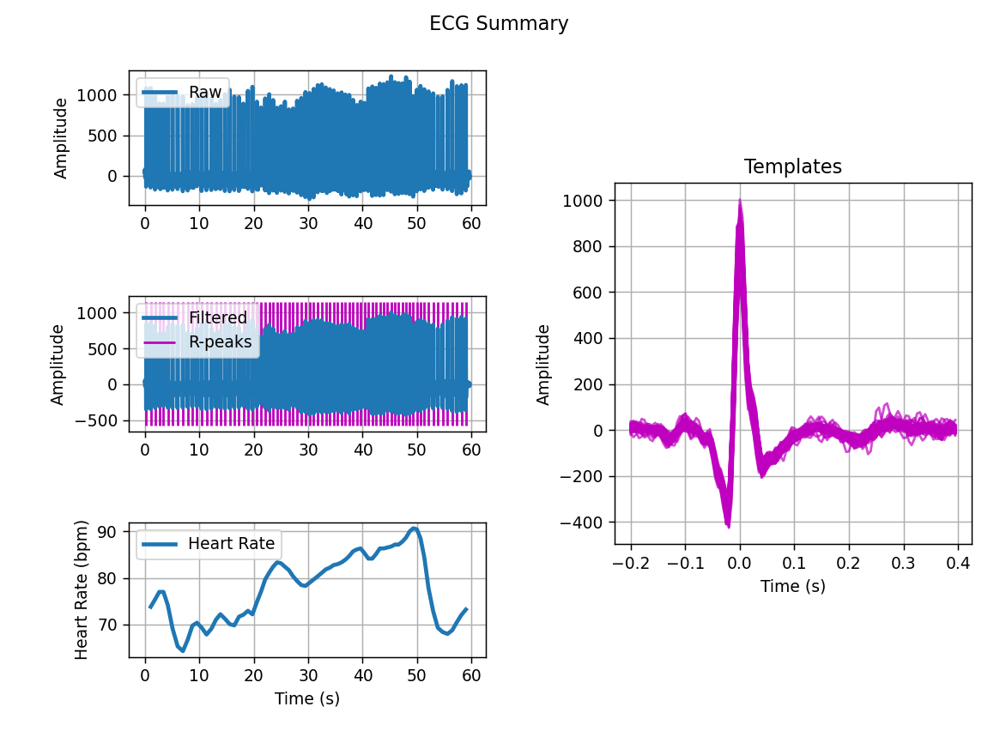

<IPython.core.display.Javascript object>


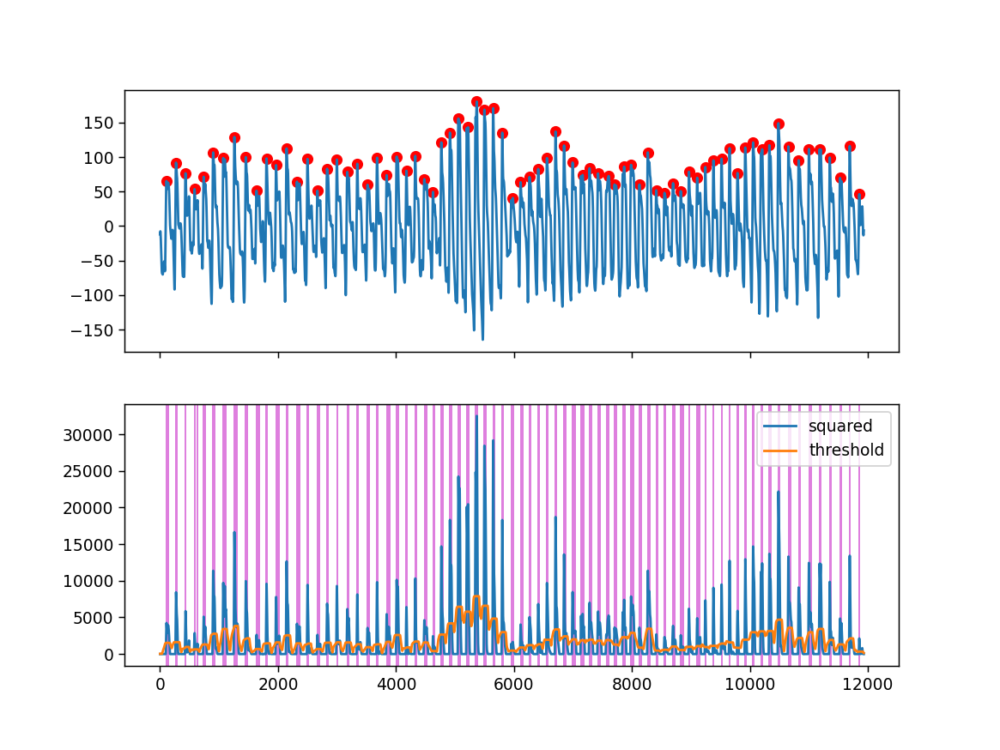

In [159]:
ecg_sen = df_sen['ecg'].values[5:]
ppg_sen = df_sen['ppg'].values[5:]

ecg_f = butter_filtering(ecg_sen, 200, [0.1, 50], 5, 'bandpass')
ppg_f = butter_filtering(ppg_sen, 200, [0.5, 10], 5, 'bandpass')

from biosppy.signals import ecg
ecg_feat = ecg.ecg(1*ecg_f, sampling_rate=200.0, show=True)
ts = ecg_feat[0]
filtered = ecg_feat[1]
rpeaks = ecg_feat[2]
templates_ts = ecg_feat[3]
templates = ecg_feat[4]
heart_rate_ts = ecg_feat[5]
heart_rate = ecg_feat[6]

import neurokit2 as nk
info = nk.ppg_findpeaks(-1*ppg_f, sampling_rate=200, method='elgendi', show=True)

<IPython.core.display.Javascript object>


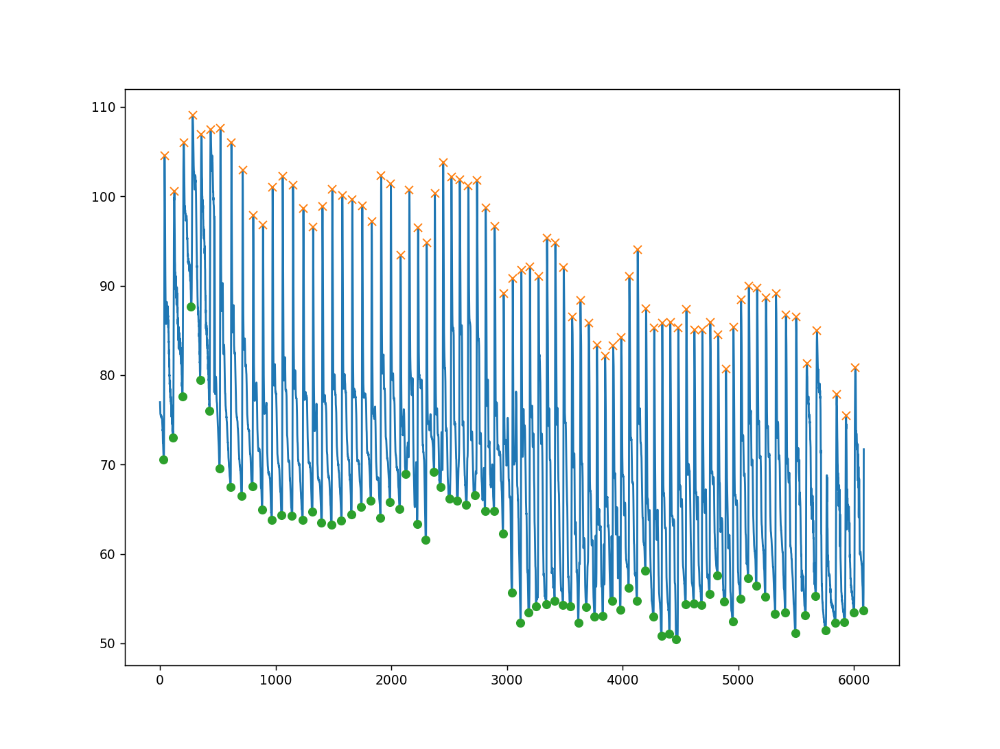

79

In [163]:
abp = df_wav['Pressure [mmHg]'].values[13691:19778]
plt.figure(figsize = (8,6))
plt.plot(abp)
sbp_loc = find_peaks(abp, distance = 50, height = 75,prominence=1)[0]
dbp_loc = find_peaks(-1*abp, distance = 50, height = -105, width = 2, prominence = 1)[0]
plt.plot(sbp_loc, abp[sbp_loc], 'x')
plt.plot(dbp_loc, abp[dbp_loc], 'o')
len(dbp_loc)

In [164]:
#200Hz 5s window = 1000samples
#2.5s overlapping step = 500samples
#calculate HR and PATpeak on each 5-second window

win = 1000#5s
step = 500#2.5s

hr_lis = []
pat_lis = []
sbp_lis = []
dbp_lis = []

for i in range(0, len(ecg_f) - win, 500):
    st_idx = i
    end_idx = i+win
    rpeaks = ecg.ecg(-1*ecg_f[st_idx:end_idx], sampling_rate=200.0, show=False)[2]
    if i==0:
        start_time = rpeaks[0]/200
    intervals = np.diff(rpeaks)/200
    hr = 60/np.mean(intervals)
    hr_lis.append(hr)
    info = nk.ppg_findpeaks(-1*ppg_f[st_idx:end_idx], sampling_rate=200, method='elgendi', show=False)
    ppeaks = info['PPG_Peaks']
    cor = np.where(ppeaks>=rpeaks[0])
    ppeaks_cor = ppeaks[cor]
    
    maxlen = min(len(ppeaks_cor),len(rpeaks) )
    pat = np.mean((ppeaks_cor[:maxlen] - rpeaks[:maxlen])/200)
    pat_lis.append(pat)
    
win_bp = 5*100
step_bp = 2.5*100

for i in range(0, len(abp)-500, int(step_bp)):
    st_idx = i
    end_idx = i+win
    sbp_loc = find_peaks(abp[st_idx:end_idx],  distance = 50, height = 75, width = 1,prominence=1)[0]
    sbp_mean = np.mean(abp[st_idx:end_idx][sbp_loc])
    sbp_lis.append(sbp_mean)
    
    dbp_loc = find_peaks(-1*abp[st_idx:end_idx], distance = 50, height = -105, width = 2, prominence = 1)[0]
    dbp_mean = np.mean(abp[st_idx:end_idx][dbp_loc])
    dbp_lis.append(dbp_mean)
print(len(hr_lis), len(sbp_lis))

22 23


<IPython.core.display.Javascript object>


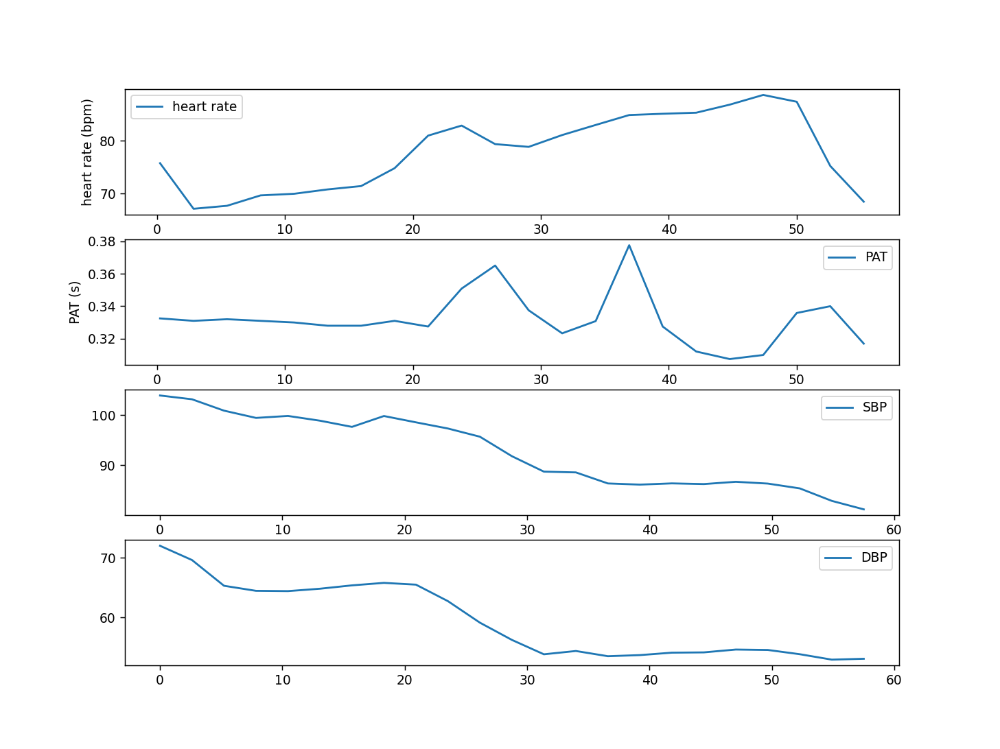

In [165]:
ts_hr = np.linspace(5/200+start_time,start_time+ 5/200+2.5*len(hr_lis), len(hr_lis))
ts_pat = np.linspace(start_time +5/200, start_time+5/200+2.5*len(pat_lis), len(pat_lis))
ts_sbp = np.linspace(0,2.5*len(sbp_lis), len(sbp_lis) )
ts_dbp = np.linspace(0,2.5*len(dbp_lis), len(dbp_lis))
fig, axs = plt.subplots(4,1,figsize = (8,6))
ax = axs[0]
#ax.set_title('valsalva maneuver 10s')
ax.plot(ts_hr, hr_lis, label = "heart rate")
ax.set_xlabel('time(s)');ax.set_ylabel('heart rate (bpm)')
ax.legend()

ax = axs[1]
ax.plot(ts_pat, pat_lis, label = "PAT")
#ax.axvline(x= 10, ls = ':', c = 'g', label = 'start')
#ax.axvline(x= , ls = '--', c = 'r', label = 'end')
ax.set_xlabel('time(s)'); ax.set_ylabel('PAT (s)')
ax.legend()

ax = axs[2]
ax.plot(ts_sbp,sbp_lis, label = 'SBP')
ax.legend()

ax= axs[3]
ax.plot(ts_dbp, dbp_lis, label = 'DBP')
ax.legend()

In [166]:
df_1918 = pd.DataFrame({'hr':hr_lis[-22:], 'pat':pat_lis[-22:], 'sbp':sbp_lis[-22:], 'dbp':dbp_lis[-22:]})
df_1918

,hr,pat,sbp,dbp
0,75.757576,0.332500,103.152500,69.629167
1,67.132867,0.331000,100.881667,65.322500
2,67.700987,0.332000,99.430000,64.475833
3,69.666183,0.331000,99.823333,64.428333
4,69.970845,0.330000,98.873333,64.830000
5,70.796460,0.328000,97.636923,65.391667
6,71.428571,0.328000,99.807692,65.808462
7,74.812968,0.331000,98.544615,65.512308
8,80.971660,0.327500,97.311538,62.749231
9,82.872928,0.350833,95.670714,59.146154


In [167]:
df_1918.to_csv("1918_fb.csv", index = False)